### LendingClub Case study Exploratory Data Analysis
#### Introduction

LendingClub is a financial services company headquartered in San Francisco, California. LendingClub is an online financial service that connects borrowers with loans that fit their needs. It works best for borrowers with good to excellent credit who are looking for personal loans or debt consolidation.

LendingClub began offering loans in 2007 as a peer-to-peer online lender and has lent more than $85 billion in the years since. It’s also expanded its banking services to checking and savings accounts, and has 4.7 million members, making it one of the nation’s biggest online banks.

  
### Business Understanding

This work for a consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to <b>make a decision for loan approval based on the applicant’s profile.</b> Two types of risks are associated with the bank’s decision:
<ul>
<li>
If the applicant is <b>likely to repay the loan</b>, then not approving the loan results in a loss of business to the company
</li>
<li>
If the applicant is <b>not likely to repay the loan</b>, i.e. he/she is likely to default, then approving the loan may lead to a <b>financial loss</b> for the company
</li>
</ul>
 

The loan data given contains information about past loan applicants and whether they ‘defaulted’ or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc.

In this case study, we will use EDA to understand how consumer attributes and loan attributes influence the tendency of default.

<img src="Loan_image.png" />

When a person applies for a loan, there are two types of decisions that could be taken by the company:

<ol>
<li><b>Loan accepted:</b> If the company approves the loan, there are 3 possible scenarios described below:
<ul>
<li><b>Fully paid:</b> Applicant has fully paid the loan (the principal and the interest rate)
</li>
<li><b>Current:</b> Applicant is in the process of paying the instalments, i.e. the tenure of the loan is not yet completed. These candidates are not labelled as 'defaulted'.
</li>
<li><b>Charged-off:</b> Applicant has not paid the instalments in due time for a long period of time, i.e. he/she has defaulted on the loan 
</li>
</ul>
</li>
<li><b>Loan rejected:</b> The company had rejected the loan (because the candidate does not meet their requirements etc.). Since the loan was rejected, there is no transactional history of those applicants with the company and so this data is not available with the company (and thus in this dataset)
</li>
</ol>


### Business Objective
This company is the largest online loan marketplace, facilitating personal loans, business loans, and financing of medical procedures. Borrowers can easily access lower interest rate loans through a fast online interface. 

 

Like most other lending companies, lending loans to ‘risky’ applicants is the largest source of financial loss (called credit loss). Credit loss is the amount of money lost by the lender when the borrower refuses to pay or runs away with the money owed. In other words, borrowers who default cause the largest amount of loss to the lenders. In this case, the customers labelled as 'charged-off' are the 'defaulters'. 

 

If one is able to identify these risky loan applicants, then such loans can be reduced thereby cutting down the amount of credit loss. Identification of such applicants using EDA is the aim of this case study.

 

In other words, the company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

#### Import required liberary

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#### Read dataset and print shape of dataset

In [3]:
loan_data = pd.read_csv("loan\loan.csv", engine='python')
##print the shape of the data to see how many rows and columns available
loan_data.shape


(39717, 111)

In [4]:
loan_data.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
loan_data.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Dtype  
---   ------                          -----  
 0    id                              int64  
 1    member_id                       int64  
 2    loan_amnt                       int64  
 3    funded_amnt                     int64  
 4    funded_amnt_inv                 float64
 5    term                            object 
 6    int_rate                        object 
 7    installment                     float64
 8    grade                           object 
 9    sub_grade                       object 
 10   emp_title                       object 
 11   emp_length                      object 
 12   home_ownership                  object 
 13   annual_inc                      float64
 14   verification_status             object 
 15   issue_d                         object 
 16   loan_status                     object 
 17   pymnt_plan

In [6]:
loan_data.describe()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717.000000,3.971700e+04,39717.000000,39717.000000,39717.000000,14035.000000,2786.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39717.000000,39661.0,0.0,39717.0,0.0,0.0,0.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39661.0,39717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,324.561922,6.896893e+04,13.315130,0.146512,0.869200,35.900962,69.698134,9.294408,0.055065,13382.528086,22.088828,51.227887,50.989768,12153.596544,11567.149118,9793.348813,2263.663172,1.363015,95.221624,12.406112,2678.826162,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,208.874874,6.379377e+04,6.678594,0.491812,1.070219,22.020060,43.822529,4.400282,0.237200,15885.016641,11.401709,375.172839,373.824457,9042.040766,8942.672613,7065.522127,2608.111964,7.289979,688.744771,148.671593,4447.136012,0.0,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,15.690000,4.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,167.020000,4.040400e+04,8.170000,0.000000,0.000000,18.000000,22.000000,6.000000,0.000000,3703.000000,13.000000,0.000000,0.000000,5576.930000,5112.310000,4600.000000,662.180000,0.000000,0.000000,0.000000,218.680000,0.0,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [7]:
print(loan_data.columns)

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       ...
       'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
       'percent_bc_gt_75', 'pub_rec_bankruptcies', 'tax_liens',
       'tot_hi_cred_lim', 'total_bal_ex_mort', 'total_bc_limit',
       'total_il_high_credit_limit'],
      dtype='object', length=111)


## Missing Values initial cleanup

Print number of missing values per column

In [8]:
loan_data.isnull().sum()

id                                    0
member_id                             0
loan_amnt                             0
funded_amnt                           0
funded_amnt_inv                       0
term                                  0
int_rate                              0
installment                           0
grade                                 0
sub_grade                             0
emp_title                          2459
emp_length                         1075
home_ownership                        0
annual_inc                            0
verification_status                   0
issue_d                               0
loan_status                           0
pymnt_plan                            0
url                                   0
desc                              12940
purpose                               0
title                                11
zip_code                              0
addr_state                            0
dti                                   0


In [9]:
# percentage of missing values per column
missing_values_per_col_percentage = round(100*(loan_data.isnull().sum()/(loan_data.shape[0])), 2)
missing_values_per_col_percentage.loc[missing_values_per_col_percentage > 0]

emp_title                           6.19
emp_length                          2.71
desc                               32.58
title                               0.03
mths_since_last_delinq             64.66
mths_since_last_record             92.99
revol_util                          0.13
last_pymnt_d                        0.18
next_pymnt_d                       97.13
last_credit_pull_d                  0.01
collections_12_mths_ex_med          0.14
mths_since_last_major_derog       100.00
annual_inc_joint                  100.00
dti_joint                         100.00
verification_status_joint         100.00
tot_coll_amt                      100.00
tot_cur_bal                       100.00
open_acc_6m                       100.00
open_il_6m                        100.00
open_il_12m                       100.00
open_il_24m                       100.00
mths_since_rcnt_il                100.00
total_bal_il                      100.00
il_util                           100.00
open_rv_12m     

In [10]:
#columns with more than 75% missing data
missing_values_per_col_percentage.loc[missing_values_per_col_percentage > 75]

mths_since_last_record             92.99
next_pymnt_d                       97.13
mths_since_last_major_derog       100.00
annual_inc_joint                  100.00
dti_joint                         100.00
verification_status_joint         100.00
tot_coll_amt                      100.00
tot_cur_bal                       100.00
open_acc_6m                       100.00
open_il_6m                        100.00
open_il_12m                       100.00
open_il_24m                       100.00
mths_since_rcnt_il                100.00
total_bal_il                      100.00
il_util                           100.00
open_rv_12m                       100.00
open_rv_24m                       100.00
max_bal_bc                        100.00
all_util                          100.00
total_rev_hi_lim                  100.00
inq_fi                            100.00
total_cu_tl                       100.00
inq_last_12m                      100.00
acc_open_past_24mths              100.00
avg_cur_bal     

In [11]:
missing_values_col_nm_50 = list(missing_values_per_col_percentage[missing_values_per_col_percentage >= 50].index)

len(missing_values_col_nm_50)

57

##### Drop 56 columns with more than 75% null values

In [12]:
print(loan_data.shape)
loan_data.drop(columns=missing_values_col_nm_50, axis=1, inplace=True)
print(loan_data.shape)

(39717, 111)
(39717, 54)


In [13]:
loan_data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

##### TODO: For now drop url and desc columns as they are string columns with text data, but later we can see if through NLP we can get something from this data as well

In [14]:
loan_data.drop(columns=['url', 'desc'], axis=1, inplace=True)
print(loan_data.shape)

(39717, 52)


Check number of unique values for each column

In [15]:
for col in loan_data.columns:
    print(f"Unique number of values for column {col}: {len(loan_data[col].unique())}")

Unique number of values for column id: 39717
Unique number of values for column member_id: 39717
Unique number of values for column loan_amnt: 885
Unique number of values for column funded_amnt: 1041
Unique number of values for column funded_amnt_inv: 8205
Unique number of values for column term: 2
Unique number of values for column int_rate: 371
Unique number of values for column installment: 15383
Unique number of values for column grade: 7
Unique number of values for column sub_grade: 35
Unique number of values for column emp_title: 28821
Unique number of values for column emp_length: 12
Unique number of values for column home_ownership: 5
Unique number of values for column annual_inc: 5318
Unique number of values for column verification_status: 3
Unique number of values for column issue_d: 55
Unique number of values for column loan_status: 3
Unique number of values for column pymnt_plan: 1
Unique number of values for column purpose: 14
Unique number of values for column title: 1961

In [16]:
loan_data['pymnt_plan'].unique()

array(['n'], dtype=object)

## dropping all columns with single value as it does not give anay information

In [17]:
for col in loan_data.columns:
    if len(loan_data[col].unique()) <=1:
        loan_data.drop(columns=[col], axis=1, inplace=True)
        print(f"Dropped column {col}")

Dropped column pymnt_plan
Dropped column initial_list_status
Dropped column policy_code
Dropped column application_type
Dropped column acc_now_delinq
Dropped column delinq_amnt


In [18]:
loan_data.shape

(39717, 46)

## drop any columns which are just unique identifier for the data

In [19]:
for col in loan_data.columns:
    if len(loan_data[col].unique()) ==loan_data.shape[0]:
        loan_data.drop(columns=[col], axis=1, inplace=True)
        print(f"Dropped column {col}")

Dropped column id
Dropped column member_id


Print unique values for columns having 2-10values

In [20]:
for col in loan_data.columns:
    if len(loan_data[col].unique()) <= 10:
        print(f"Unique values for column {col}:")
        print(loan_data[col].unique())
        print("###########################")

Unique values for column term:
[' 36 months' ' 60 months']
###########################
Unique values for column grade:
['B' 'C' 'A' 'E' 'F' 'D' 'G']
###########################
Unique values for column home_ownership:
['RENT' 'OWN' 'MORTGAGE' 'OTHER' 'NONE']
###########################
Unique values for column verification_status:
['Verified' 'Source Verified' 'Not Verified']
###########################
Unique values for column loan_status:
['Fully Paid' 'Charged Off' 'Current']
###########################
Unique values for column inq_last_6mths:
[1 5 2 0 3 4 6 7 8]
###########################
Unique values for column pub_rec:
[0 1 2 3 4]
###########################
Unique values for column collections_12_mths_ex_med:
[ 0. nan]
###########################
Unique values for column chargeoff_within_12_mths:
[ 0. nan]
###########################
Unique values for column pub_rec_bankruptcies:
[ 0.  1.  2. nan]
###########################
Unique values for column tax_liens:
[ 0. nan]
######

Drop columns with values like [ 0. nan], as it is not valid values

In [21]:
nan_0_col =['chargeoff_within_12_mths','tax_liens','collections_12_mths_ex_med']
loan_data.drop(columns=nan_0_col, axis=1, inplace=True)

Checking pub_rec_bankruptcies columns where we see nan

In [22]:
loan_data.pub_rec_bankruptcies.value_counts()

0.0    37339
1.0     1674
2.0        7
Name: pub_rec_bankruptcies, dtype: int64

In [23]:
39717- (37339+1674+7)

697

We see 697 records with nan which is not defined. pub_rec_bankruptcies is the number of bank ruptcies. lets drop nan instead of imputing.

In [24]:
loan_data=loan_data[~loan_data.pub_rec_bankruptcies.isnull()]
loan_data.shape

(39020, 41)

In [25]:
# percentage of missing values per column
missing_values_per_col_percentage = round(100*(loan_data.isnull().sum()/(loan_data.shape[0])), 2)
missing_values_per_col_percentage.loc[missing_values_per_col_percentage > 0]

emp_title       6.19
emp_length      2.75
title           0.03
revol_util      0.13
last_pymnt_d    0.18
dtype: float64

## Handle emp_title (Employment Title) and emp_length (Employment year) missing values)

In [26]:
loan_data[(loan_data.emp_title.isnull()) & (loan_data.emp_length.isnull())].shape

(1019, 41)

In [27]:
loan_data[(loan_data.emp_title.isnull()) & (loan_data.emp_length.isnull())].head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
168,2500,2500,2500.0,36 months,7.51%,77.78,A,A3,NaN,NaN,OWN,12000.0,Source Verified,Dec-11,Charged Off,debt_consolidation,GET FREE OF DEBT,961xx,CA,16.30,0,Aug-94,2,13,0,4853,42.20%,20,0.0,0.0,1838.880000,1838.88,1575.06,253.74,0.0,10.08,0.0000,Dec-13,77.78,May-16,0.0
323,18000,18000,18000.0,60 months,17.58%,452.98,D,D4,NaN,NaN,MORTGAGE,60000.0,Verified,Dec-11,Fully Paid,debt_consolidation,consolidation,363xx,AL,21.96,0,Mar-03,1,11,0,5945,83.70%,28,0.0,0.0,26378.550010,26378.55,18000.00,8378.55,0.0,0.00,0.0000,Sep-15,6909.59,Sep-15,0.0
394,4000,4000,4000.0,36 months,11.71%,132.31,B,B3,NaN,NaN,RENT,24000.0,Source Verified,Dec-11,Fully Paid,home_improvement,Reline pool and fix steeps,328xx,FL,7.50,1,Feb-05,0,4,0,1593,54.90%,6,0.0,0.0,4186.023030,4186.02,4000.00,186.02,0.0,0.00,0.0000,May-12,3658.15,May-12,0.0
422,1000,1000,1000.0,36 months,14.65%,34.50,C,C3,NaN,NaN,RENT,18408.0,Not Verified,Dec-11,Charged Off,major_purchase,Myloan,080xx,NJ,6.00,0,Apr-93,2,3,1,2510,83.70%,8,0.0,0.0,91.310000,91.31,22.24,12.18,0.0,56.89,10.2402,Jan-12,34.50,Jun-12,1.0
439,8250,8250,8250.0,36 months,7.51%,256.67,A,A3,NaN,NaN,MORTGAGE,31500.0,Verified,Dec-11,Fully Paid,debt_consolidation,do over,218xx,MD,17.87,0,Dec-81,4,17,0,7521,10.40%,37,0.0,0.0,9239.889998,9239.89,8250.00,989.89,0.0,0.00,0.0000,Dec-14,278.92,Dec-14,0.0


In [28]:
print(loan_data.shape)
loan_data=loan_data[~((loan_data.emp_title.isnull()) & (loan_data.emp_length.isnull()))]
print(loan_data.shape)

(39020, 41)
(38001, 41)


#### Drop emp_length with null values

In [29]:
print(loan_data.shape)
loan_data=loan_data[~((loan_data.emp_length.isnull()))]
print(loan_data.shape)

(38001, 41)
(37945, 41)


In [30]:
loan_data[loan_data.emp_title.isnull()].head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.70%,9,0.0,0.0,5863.155187,5833.84,5000.00,863.16,0.0,0.00,0.00,Jan-15,171.62,May-16,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.50%,10,0.0,0.0,3005.666844,3005.67,2400.00,605.67,0.0,0.00,0.00,Jun-14,649.91,May-16,0.0
8,5600,5600,5600.0,60 months,21.28%,152.39,F,F2,NaN,4 years,OWN,40000.0,Source Verified,Dec-11,Charged Off,small_business,Expand Business & Buy Debt Portfolio,958xx,CA,5.55,0,Apr-04,2,11,0,5210,32.60%,13,0.0,0.0,646.020000,646.02,162.02,294.94,0.0,189.06,2.09,Apr-12,152.39,Aug-12,0.0
30,4375,4375,4375.0,36 months,7.51%,136.11,A,A3,NaN,7 years,MORTGAGE,17108.0,Source Verified,Dec-11,Fully Paid,debt_consolidation,Debt Consolidation,141xx,NY,20.34,0,Dec-87,0,6,0,11210,86.90%,12,0.0,0.0,4899.960000,4899.96,4375.00,524.96,0.0,0.00,0.00,Jan-15,144.94,Dec-14,0.0
42,3000,3000,3000.0,36 months,18.25%,108.84,D,D5,NaN,9 years,MORTGAGE,65000.0,Not Verified,Dec-11,Fully Paid,other,Year End Cleanup,180xx,PA,17.39,0,Sep-98,0,8,0,43936,98.10%,22,0.0,0.0,3917.949999,3917.95,3000.00,917.95,0.0,0.00,0.00,Jan-15,115.38,May-16,0.0


In [31]:
loan_data[loan_data.emp_title.isnull()].shape

(1397, 41)

In [32]:
loan_data.emp_title =loan_data.emp_title.fillna("Unknown")

In [33]:
loan_data[loan_data.emp_title.isnull()].head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies


##### Handle revol_util and last_pymnt_d null values

In [34]:
loan_data[loan_data.revol_util.isnull()].shape

(47, 41)

In [35]:
loan_data[loan_data.revol_util.isnull()].head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
3565,8000,8000,8000.0,36 months,19.42%,294.95,E,E3,Medline Industries Inc,3 years,RENT,30000.0,Source Verified,Nov-11,Fully Paid,debt_consolidation,Dent Consolidation,600xx,IL,18.56,0,Sep-92,1,6,0,0,NaN,10,0.0,0.0,10706.010820,10706.01,8000.00,2691.01,15.0,0.00,0.0000,Dec-14,76.83,Dec-15,0.0
4943,7200,7200,7200.0,36 months,14.27%,247.03,C,C2,cal-trans,7 years,RENT,48000.0,Not Verified,Oct-11,Fully Paid,debt_consolidation,legal expenses,961xx,CA,15.28,0,Mar-97,0,2,0,0,NaN,25,0.0,0.0,7306.070000,7306.07,7200.00,106.07,0.0,0.00,0.0000,Apr-12,66.27,Mar-14,0.0
12042,3000,3000,3000.0,60 months,22.11%,83.05,G,G1,abbeycare inc,6 years,OWN,17652.0,Source Verified,Jul-11,Charged Off,other,bill loan,551xx,MN,0.00,0,Jan-08,0,3,0,0,NaN,5,0.0,0.0,498.490000,498.49,113.96,217.52,0.0,167.01,30.0618,Nov-11,83.05,Apr-12,0.0
12147,4275,4275,4275.0,36 months,15.99%,150.28,D,D2,"Global Textiles Alliance,Inc",7 years,MORTGAGE,54500.0,Not Verified,Jul-11,Fully Paid,home_improvement,Home improvement,273xx,NC,7.49,0,Jun-05,0,2,0,0,NaN,9,0.0,0.0,5356.188342,5356.19,4275.00,1081.19,0.0,0.00,0.0000,Dec-13,1166.73,Jan-14,0.0
13891,2000,2000,1900.0,36 months,18.39%,72.70,E,E2,affordable spiral stairs,1 year,RENT,24000.0,Not Verified,Jun-11,Charged Off,other,personal,850xx,AZ,22.60,0,May-06,3,3,0,0,NaN,16,0.0,0.0,89.790000,89.79,0.00,0.00,0.0,89.79,0.8500,NaN,0.00,Nov-11,0.0


In [36]:
loan_data.revol_util.value_counts()


0%        906
0.20%      60
66.60%     56
61%        56
40.70%     56
63%        56
0.10%      55
70.40%     55
66.70%     55
31.20%     55
46.40%     55
64.80%     55
32%        54
37.60%     54
68.60%     53
68.70%     53
70.80%     53
27.20%     53
48.90%     53
46.60%     53
78.70%     53
57.40%     53
65.90%     52
51.60%     52
76.60%     52
64.60%     52
70.10%     52
41%        52
62.80%     52
45.60%     52
49.80%     52
75.50%     51
48%        51
54.60%     51
89.50%     51
74.90%     51
25.50%     51
66.10%     51
72.10%     51
66.90%     51
48.20%     51
55.50%     51
29.10%     51
51.50%     50
35.30%     50
60.20%     50
55.80%     50
64.30%     50
55.10%     50
35.70%     50
43.40%     50
54.30%     50
41.60%     50
45.90%     49
58.70%     49
49.60%     49
53.90%     49
49.10%     49
36.50%     49
89.90%     49
47.80%     49
88%        49
23.70%     49
55.20%     49
30.90%     49
62.30%     49
57.80%     48
47.40%     48
57.90%     48
41.40%     48
87.60%     48
59.60%

In [37]:
loan_data=loan_data[~loan_data.revol_util.isnull()]


In [38]:
loan_data[loan_data.last_pymnt_d.isnull()]

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
26,15000,15000,8725.0,36 months,14.27%,514.64,C,C2,nyc transit,9 years,RENT,60000.0,Not Verified,Dec-11,Charged Off,debt_consolidation,consolidation,103xx,NY,15.22,0,Oct-03,1,7,0,5872,57.60%,11,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0000,NaN,0.0,May-16,0.0
2724,8000,8000,3975.0,36 months,14.65%,275.96,C,C3,Southern Felt,10+ years,RENT,72000.0,Source Verified,Nov-11,Charged Off,debt_consolidation,bebt consolidation,278xx,NC,22.28,0,Nov-97,1,10,0,32955,85.80%,31,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0000,NaN,0.0,May-16,0.0
3613,6400,6400,6400.0,60 months,18.25%,163.39,D,D5,akrons children hospitial,5 years,RENT,33000.0,Source Verified,Nov-11,Charged Off,major_purchase,loan,445xx,OH,9.05,0,Jun-06,3,4,0,2237,60.50%,6,0.0,0.0,366.75,366.75,0.0,0.0,0.0,366.75,66.0150,NaN,0.0,Apr-12,0.0
3985,18000,18000,18000.0,60 months,19.03%,467.23,E,E2,ZIMFA INC,4 years,RENT,36000.0,Verified,Nov-11,Charged Off,debt_consolidation,debtconsolidation,061xx,CT,5.43,0,Aug-08,1,13,0,4545,18.60%,17,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0000,NaN,0.0,Apr-16,0.0
4206,1800,1800,1800.0,36 months,8.90%,57.16,A,A5,Hospira worldwide,9 years,RENT,50400.0,Not Verified,Nov-11,Charged Off,wedding,Wedding,917xx,CA,2.64,0,Oct-98,1,3,0,1930,16.10%,10,0.0,0.0,1800.00,1800.00,0.0,0.0,0.0,1800.00,0.0000,NaN,0.0,May-16,0.0
4803,1500,1500,1500.0,36 months,16.29%,52.96,D,D1,SPY-TECH,1 year,RENT,27000.0,Not Verified,Oct-11,Charged Off,wedding,Wedding exspenses,301xx,GA,18.53,0,Sep-07,2,9,0,743,26.50%,12,0.0,0.0,86.05,86.05,0.0,0.0,0.0,86.05,15.4890,NaN,0.0,Apr-12,0.0
5716,2000,2000,2000.0,36 months,7.51%,62.23,A,A3,Southbay Respite,4 years,RENT,18000.0,Not Verified,Oct-11,Charged Off,other,Personal Loan,919xx,CA,16.73,0,Jul-04,0,5,0,2925,33.20%,20,0.0,0.0,89.89,89.89,0.0,0.0,0.0,89.89,0.8700,NaN,0.0,Mar-12,0.0
6253,1400,1400,1400.0,36 months,8.90%,44.46,A,A5,RRAD,8 years,MORTGAGE,28800.0,Not Verified,Oct-11,Charged Off,debt_consolidation,Debt Consolidation Loan,755xx,TX,22.25,1,Feb-06,1,6,0,612,29.10%,26,0.0,0.0,62.86,62.86,0.0,0.0,0.0,62.86,0.5900,NaN,0.0,Sep-15,0.0
6259,30000,30000,7100.0,60 months,19.03%,778.72,E,E2,Military,10+ years,MORTGAGE,51600.0,Verified,Oct-11,Charged Off,debt_consolidation,Debt Consolidation Loan,765xx,TX,19.09,0,Dec-99,3,9,0,22880,83.50%,48,0.0,0.0,1719.57,406.96,0.0,0.0,0.0,1719.57,309.5226,NaN,0.0,Mar-12,0.0
6768,4000,4000,3975.0,60 months,19.03%,103.83,E,E2,Manpower,< 1 year,RENT,19200.0,Source Verified,Sep-11,Charged Off,debt_consolidation,Debt Consolidation Loan,630xx,MO,12.75,0,Aug-99,3,6,0,3887,82.70%,7,0.0,0.0,179.57,178.45,0.0,0.0,0.0,179.57,1.6600,NaN,0.0,Mar-12,0.0


In [39]:
loan_data.last_pymnt_d.value_counts()

May-16    1209
Mar-13     999
Dec-14     910
May-13     884
Feb-13     845
Mar-12     827
Apr-13     822
Aug-12     809
Oct-12     806
Mar-14     805
Jan-14     800
Aug-14     797
Jul-14     793
Oct-14     778
Feb-14     768
Jan-13     767
Dec-13     757
Sep-12     752
Jul-13     749
Jun-14     744
Nov-12     723
Jul-12     723
May-12     717
Feb-12     717
Apr-12     717
Aug-13     702
Dec-12     690
Jun-12     682
Oct-13     672
Jun-13     670
May-14     659
Sep-14     658
Sep-13     654
Apr-14     653
Nov-13     644
Nov-14     560
Jan-12     532
Dec-11     526
Nov-11     440
Sep-11     437
Oct-11     437
Aug-11     420
Apr-11     404
Mar-11     392
Jul-11     382
May-11     368
Jun-11     362
Jan-15     326
Feb-11     266
Jul-15     244
Nov-15     222
Apr-16     217
Jun-15     216
Mar-16     210
Dec-10     207
Jan-11     203
Aug-15     200
Sep-15     199
Oct-10     190
Oct-15     182
Mar-15     180
Jan-16     178
Dec-15     171
Nov-10     162
Feb-16     162
Feb-15     161
Jul-10    

Records does not look correct with unknown last_pymnt_d, so dropping them

In [40]:
loan_data=loan_data[~loan_data.last_pymnt_d.isnull()]

In [41]:
loan_data.shape

(37836, 41)

In [42]:
loan_data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'purpose', 'title', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'pub_rec_bankruptcies'],
      dtype='object')

In [43]:
len(loan_data.columns)

41

Handle <b style="color:blue">term</b> columns

In [44]:
loan_data.term.value_counts()

 36 months    27499
 60 months    10337
Name: term, dtype: int64

In [45]:
## It can be considered as categorical column as it contain only one column
loan_data['term'] = loan_data['term'].str.replace("months","")
loan_data['term'] = loan_data['term'].astype(int)
loan_data['term'].value_counts()

36    27499
60    10337
Name: term, dtype: int64

Handle <b style="color:blue">int_rate</b> columns

In [46]:
# replace % to empty, so can be converted as decimal for further analysis
loan_data['int_rate'] = loan_data['int_rate'].str.replace("%","")
loan_data['int_rate'] = loan_data['int_rate'].astype(float)
#loan_data['int_rate'].value_counts()

Handle <b style="color:blue">emp_length</b> columns

In [47]:
# Removing words 'Years' , < and + signs. 
loan_data['emp_length'] =loan_data['emp_length'].str.replace("years","").str.replace("year","").str.replace("+","").str.replace("< 1","0.5").str.replace("<1","0.5")
#loan_data['emp_length']=loan_data['emp_length'].str.replace("+","").str.replace("< 1","0.5")
#loan_data['emp_length']=loan_data['emp_length'].str.replace("year","")
loan_data['emp_length']=loan_data['emp_length'].astype('float64')

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\510303960.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  loan_data['emp_length'] =loan_data['emp_length'].str.replace("years","").str.replace("year","").str.replace("+","").str.replace("< 1","0.5").str.replace("<1","0.5")


In [48]:
loan_data['revol_util'] =loan_data['revol_util'].str.replace("%","")
loan_data['revol_util']=loan_data['revol_util'].astype('float64')

In [49]:
loan_data['emp_length'].value_counts()

10.0    8750
0.5     4397
2.0     4293
3.0     4023
4.0     3377
5.0     3236
1.0     3133
6.0     2193
7.0     1747
8.0     1449
9.0     1238
Name: emp_length, dtype: int64

Convert Below Date columns to Date so we can use in further analysis
<ul>
<li>
<b style="color:blue"> issue_d </b>
</li>
<li>
<b style="color:blue">earliest_cr_line</b>
</li>
<li>
<b style="color:blue">last_pymnt_d</b>
</li>
<li>
<b style="color:blue">last_credit_pull_d</b>
</li>

</ul>

In [50]:
datetime_colmns=['issue_d','earliest_cr_line','last_pymnt_d','last_credit_pull_d']
loan_data[datetime_colmns].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37836 entries, 0 to 39680
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   issue_d             37836 non-null  object
 1   earliest_cr_line    37836 non-null  object
 2   last_pymnt_d        37836 non-null  object
 3   last_credit_pull_d  37835 non-null  object
dtypes: object(4)
memory usage: 1.4+ MB


In [51]:
loan_data.issue_d = pd.to_datetime(loan_data.issue_d, format='%b-%y')
loan_data.earliest_cr_line = pd.to_datetime(loan_data.earliest_cr_line, format='%b-%y')
loan_data.last_pymnt_d = pd.to_datetime(loan_data.last_pymnt_d, format='%b-%y')
loan_data.last_credit_pull_d = pd.to_datetime(loan_data.last_credit_pull_d, format='%b-%y')

In [52]:
loan_data[datetime_colmns].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 37836 entries, 0 to 39680
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   issue_d             37836 non-null  datetime64[ns]
 1   earliest_cr_line    37836 non-null  datetime64[ns]
 2   last_pymnt_d        37836 non-null  datetime64[ns]
 3   last_credit_pull_d  37835 non-null  datetime64[ns]
dtypes: datetime64[ns](4)
memory usage: 1.4 MB


In [53]:
loan_data.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,5000,5000,4975.0,36,10.65,162.87,B,B2,Unknown,10.0,RENT,24000.0,Verified,2011-12-01,Fully Paid,credit_card,Computer,860xx,AZ,27.65,0,1985-01-01,1,3,0,13648,83.7,9,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,2015-01-01,171.62,2016-05-01,0.0
1,2500,2500,2500.0,60,15.27,59.83,C,C4,Ryder,0.5,RENT,30000.0,Source Verified,2011-12-01,Charged Off,car,bike,309xx,GA,1.00,0,1999-04-01,5,3,0,1687,9.4,4,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,2013-04-01,119.66,2013-09-01,0.0
2,2400,2400,2400.0,36,15.96,84.33,C,C5,Unknown,10.0,RENT,12252.0,Not Verified,2011-12-01,Fully Paid,small_business,real estate business,606xx,IL,8.72,0,2001-11-01,2,2,0,2956,98.5,10,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,2014-06-01,649.91,2016-05-01,0.0
3,10000,10000,10000.0,36,13.49,339.31,C,C1,AIR RESOURCES BOARD,10.0,RENT,49200.0,Source Verified,2011-12-01,Fully Paid,other,personel,917xx,CA,20.00,0,1996-02-01,1,10,0,5598,21.0,37,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,2015-01-01,357.48,2016-04-01,0.0
4,3000,3000,3000.0,60,12.69,67.79,B,B5,University Medical Group,1.0,RENT,80000.0,Source Verified,2011-12-01,Current,other,Personal,972xx,OR,17.94,0,1996-01-01,0,15,0,27783,53.9,38,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,2016-05-01,67.79,2016-05-01,0.0


In [54]:
loan_data['issue_d_month'] = loan_data['issue_d'].dt.month
loan_data['issue_d_year'] = loan_data['issue_d'].dt.year

In [55]:
len(loan_data[loan_data['issue_d_year'] > 2011 ])

0

In [56]:
loan_data['earliest_cr_line_month'] = loan_data['earliest_cr_line'].dt.month
loan_data['earliest_cr_line_year'] = loan_data['earliest_cr_line'].dt.year

In [57]:
len(loan_data[loan_data['earliest_cr_line_year'] > 2011 ])

59

In [58]:
loan_data[loan_data['earliest_cr_line_year'] > 2011 ]['earliest_cr_line_year'].unique()

array([2068, 2067, 2065, 2063, 2066, 2064, 2062, 2056, 2046, 2050, 2054],
      dtype=int64)

earliest_cr_line_year should not be more than 2011 as we have data till 2011, this happens because of 2 digit year conversion

In [59]:
loan_data.loc[loan_data['earliest_cr_line_year'] > 2011 , 'earliest_cr_line_year'] = loan_data['earliest_cr_line_year'] - 10

drop <b style="color:blue">issue_d </b> and <b style="color:blue">earliest_cr_line </b> as it does not seem adding value, we already have State  

In [60]:
loan_data.drop(columns=['issue_d','earliest_cr_line'],axis=1, inplace=True)

drop <b style="color:blue">zip_code </b> as it does not seem adding value, we already have State  

In [61]:
loan_data.drop(columns=['zip_code'],axis=1, inplace=True)

<h2 style="color:Green">Univariate Analysis<h2>

In [62]:
loan_data.loan_status.value_counts()

Fully Paid     31534
Charged Off     5204
Current         1098
Name: loan_status, dtype: int64

<Axes: xlabel='loan_status', ylabel='count'>

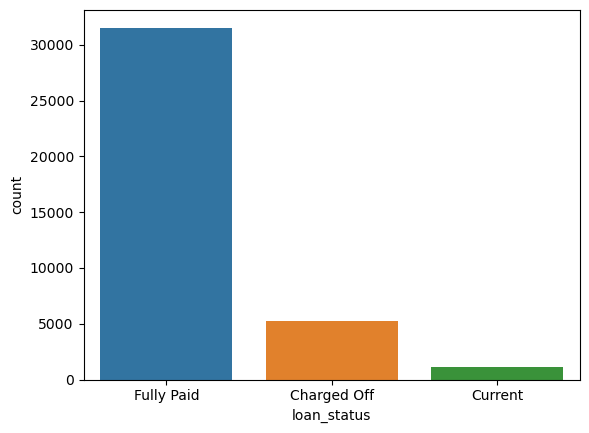

In [63]:
sns.countplot(x='loan_status', data=loan_data)

<Axes: >

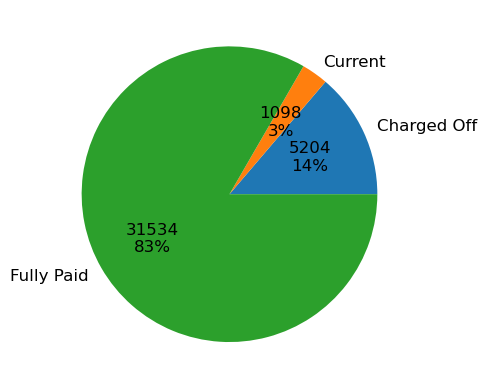

In [64]:
def label_function(val):
    return f'{val / 100 * len(loan_data):.0f}\n{val:.0f}%'
loan_data.groupby('loan_status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12})

### we can drop rows with loan_status as <b style="color:green">Current</b> because now it is not clear if it will be paid or defaulted

In [65]:
loan_data =loan_data[~(loan_data['loan_status'] == "Current")]

<Axes: >

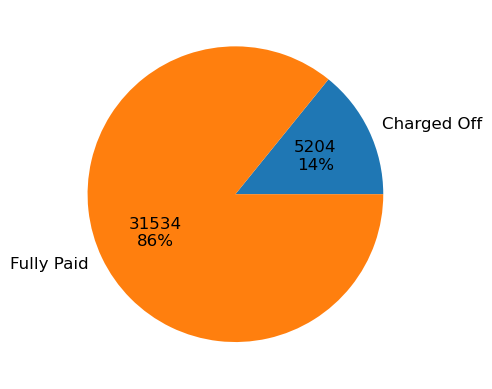

In [66]:
def label_function(val):
    return f'{val / 100 * len(loan_data):.0f}\n{val:.0f}%'
loan_data.groupby('loan_status').size().plot(kind='pie', autopct=label_function, textprops={'fontsize': 12})

<Axes: xlabel='loan_status', ylabel='count'>

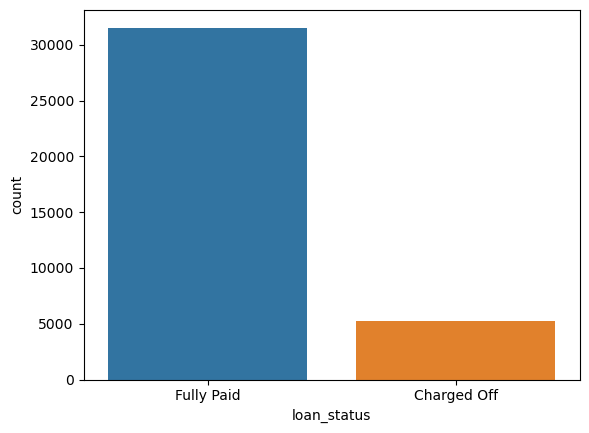

In [67]:
sns.countplot(x='loan_status', data=loan_data)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]),
 [Text(0, 0, 'credit_card'),
  Text(1, 0, 'car'),
  Text(2, 0, 'small_business'),
  Text(3, 0, 'other'),
  Text(4, 0, 'wedding'),
  Text(5, 0, 'debt_consolidation'),
  Text(6, 0, 'home_improvement'),
  Text(7, 0, 'major_purchase'),
  Text(8, 0, 'medical'),
  Text(9, 0, 'moving'),
  Text(10, 0, 'vacation'),
  Text(11, 0, 'house'),
  Text(12, 0, 'renewable_energy'),
  Text(13, 0, 'educational')])

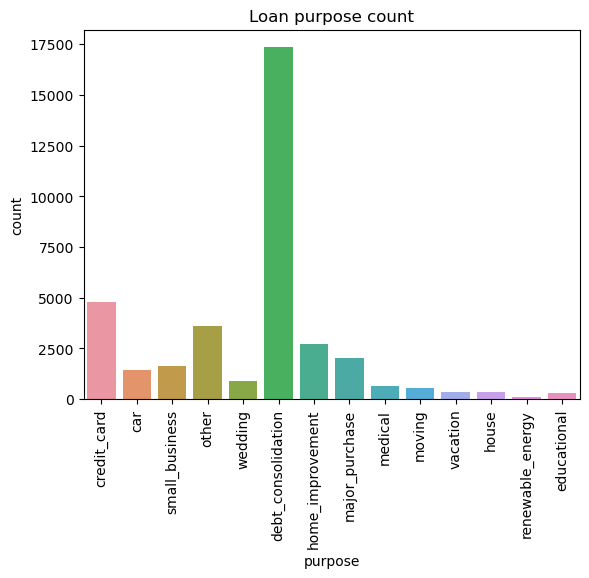

In [68]:
sns.countplot(x='purpose', data=loan_data)
plt.title("Loan purpose count")
plt.xticks(rotation=90)

In [69]:
#Solution to show labels in graph copied from internet
def showLabels_withpercent(ax, d=None):
    plt.margins(0.2, 0.2)
    rects = ax.patches
    i = 0
    locs, labels = plt.xticks() 
    counts = {}
    if not d is None:
        for key, value in d.items():
            counts[str(key)] = value

    # For each bar: Place a label
    for rect in rects:
        # Get X and Y placement of label from rect.
        y_value = rect.get_height()
        x_value = rect.get_x() + rect.get_width() / 2

        # Number of points between bar and label. Change to your liking.
        space = 5
        # Vertical alignment for positive values
        va = 'bottom'

        # If value of bar is negative: Place label below bar
        if y_value < 0:
            # Invert space to place label below
            space *= -1
            # Vertically align label at top
            va = 'top'

        # Use Y value as label and format number with one decimal place
        if d is None:
            label = "{:.1f}%".format(y_value)
        else:
            try:
                label = "{:.1f}%".format(y_value) + "\nof " + str(counts[str(labels[i].get_text())])
            except:
                label = "{:.1f}%".format(y_value)
        
        i = i+1

        # Create annotation
        plt.annotate(
            label,                      # Use `label` as label
            (x_value, y_value),         # Place label at end of the bar
            xytext=(0, space),          # Vertically shift label by `space`
            textcoords="offset points", # Interpret `xytext` as offset in points
            ha='center',                # Horizontally center label
            va=va, fontsize=12).set_rotation(90)                      # Vertically align label differently for
                                        # positive and negative values.

In [70]:
def detect_outliar(data, cols):
    n_plots =len(cols)
    n_cols = 2
    n_rows = (n_plots + 1) // n_cols
    plt.figure(figsize=(15*n_cols,5*n_rows))
    #fig, axs = plt.subplots(/2, 2)
    for plot_num in range(1, n_plots):
        col=cols[plot_num-1]
        plt.subplot(n_rows,n_cols, plot_num)
        sns.boxplot(data[col]).set(title='Plot for ' + col)
        

In [71]:
# This method plots a distribution of target column, and its boxplot against loan_status column
def plot_distribution_categorical_with_target(data, col="term", target="loan_status",fig_size=(15,5),vertical=False, annotate=True):
    plt.figure(figsize=fig_size)
    if vertical:
        plt.subplot(2, 1, 1)
    else:
        plt.subplot(1, 2, 1)
    plot = sns.countplot(x= col, data= data)
    plt.xticks(rotation=90, fontsize=12)
    if annotate:
        for p in plot.patches:
            plot.annotate('{}'.format(p.get_height()), (p.get_x()+.35, p.get_height()+20),fontsize=12).set_rotation(90)
    if vertical:
        plt.subplot(2, 1, 2)
    else:
        plt.subplot(1, 2, 2)
    plot = sns.countplot(x= col, data= data, hue=target)
    if annotate:
        for p in plot.patches:
            plot.annotate('{}'.format(p.get_height()), (p.get_x(), p.get_height()+20),fontsize=12).set_rotation(90)
    plt.xticks(rotation=90, fontsize=12)
    plt.tight_layout()
    plt.show()

In [72]:
# This method prints two plots side by side 
# Left one is percentage of a categorical variable in the entire dataset 
# Right one is percentage for Charged Off loans 
# Significant changes in percentage from left to right can indicate a value of interest
# This function also plots a given column buckets against loan_status (default = 'Charged Off')
# The plots are in percentages 
# (absolute numbers do not make sense -> category values can have very different absolute numbers)
# We want to see what are the chances of some category leading to loan default
# Absolute numbers are also printed to assess level of confidence in a % value. 
def plot_overall_percentages_and_within_percentage(data, by, sortbyindex=False, fig_size=(15,10), vertical=False, annotate=True):
    plt.figure(figsize=fig_size)
    if vertical:
        plt.subplot(4, 1, 1)
    else:
        plt.subplot(2, 2, 1)
    values = (data[by].value_counts(normalize=True)*100)
    if sortbyindex:
        values = values.sort_index()
    ax = values.plot.bar(color=sns.color_palette('husl', 16))
    ax.set_ylabel('% in Overall loan  data', fontsize=16)
    ax.set_xlabel(by, fontsize=12)
    plt.xticks(rotation=90, fontsize=12)
    if annotate:
        showLabels_withpercent(ax)
    if vertical:
        plt.subplot(4, 1, 2)
    else:
        plt.subplot(2, 2, 2)
    values = (data.loc[data['loan_status']=='Charged Off'][by].value_counts(normalize=True)*100)
    if sortbyindex:
        values = values.sort_index()
    ax = values.plot.bar(color=sns.color_palette('husl', 16))
    ax.set_ylabel('% in Defaulted loans', fontsize=16)
    plt.xticks(rotation=90, fontsize=12)
    if annotate:
        showLabels_withpercent(ax)
    
    if vertical:
        plt.subplot(4, 1, 3)
    else:
        plt.subplot(2, 2, 3)
    grp = data.groupby(['loan_status',by])[by].count()
    cnt = data.groupby(by)[by].count()
    percentages = grp.unstack() * 100 / cnt.T
    ax = percentages.loc["Fully Paid"].plot.bar(color=sns.color_palette('husl', 16))
    ax.set_ylabel('% of loans Fully Repaid')
    plt.xticks(rotation=90, fontsize=12)
    if annotate:
        showLabels_withpercent(ax, grp["Fully Paid"].to_dict())
    
    if vertical:
        plt.subplot(4, 1, 4)
    else:
        plt.subplot(2, 2, 4)
    grp = data.groupby(['loan_status',by])[by].count()
    cnt = data.groupby(by)[by].count()
    percentages = grp.unstack() * 100 / cnt.T
    ax = percentages.loc["Charged Off"].plot.bar(color=sns.color_palette('husl', 16))
    ax.set_ylabel('% of loans Defaulted')
    plt.xticks(rotation=90, fontsize=12)
    if annotate:
        showLabels_withpercent(ax, grp["Charged Off"].to_dict())
    plt.margins(0.2, 0.2)
    plt.tight_layout()

In [73]:
def plot_regression_target_comparision(data, target="loan_status", col="loan_amnt",fig_size=(15,5), vertical=False):
    plt.figure(figsize=fig_size)
    if vertical:
        plt.subplot(2, 1, 1)
    else:
        plt.subplot(1, 2, 1)
    sns.histplot(data=data, x=col, hue=target, multiple="stack")
    if vertical:
        plt.subplot(2, 1, 2)
    else:
        plt.subplot(1, 2, 2)
    sns.kdeplot(data=data, x=col, hue=target, multiple="stack")

In [74]:
# Function for numerical univariate analysis
def univariate_regression(data,col="loan_amnt",target="loan_status"):
    sns.set(font_scale=2)
    fig, axes = plt.subplots(1, 2,figsize=(15,5),dpi=50)
    sns.boxplot(ax=axes[0], x=data[col])
    axes[0].set_title(col+" distribution")

    sns.violinplot(ax=axes[1], x=data[col],kde=True)
    axes[1].set_title(col+" distribution and density")


    locs, labels = plt.xticks()
    plt.show()

In [75]:
loan_data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'loan_status',
       'purpose', 'title', 'addr_state', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'pub_rec_bankruptcies', 'issue_d_month', 'issue_d_year',
       'earliest_cr_line_month', 'earliest_cr_line_year'],
      dtype='object')

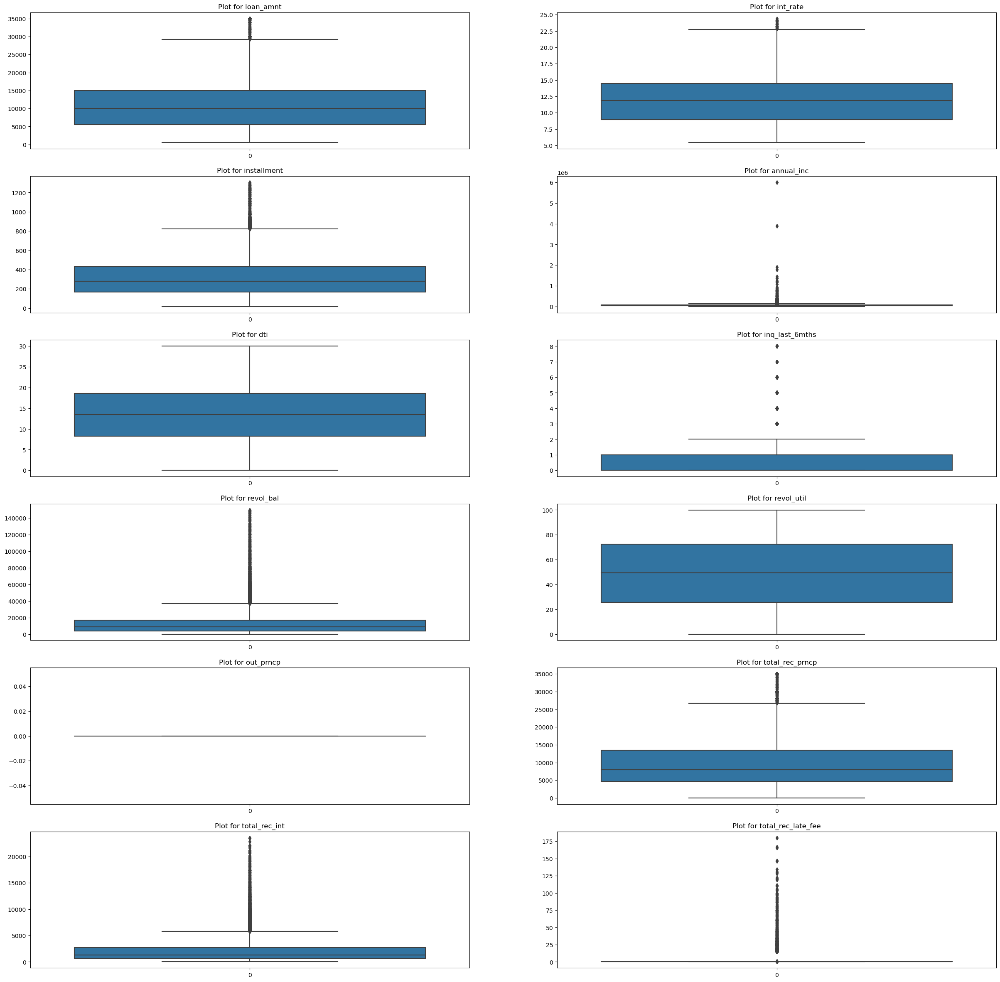

In [76]:
detect_outliar(loan_data, cols=["loan_amnt", 'int_rate', 'installment', 'annual_inc', 'dti','inq_last_6mths', 'revol_bal','revol_util',
                               'out_prncp', 'total_rec_prncp', 'total_rec_int','total_rec_late_fee','last_pymnt_amnt'])

In [77]:
## We can see a lot of deviation in annual income but can not consider as outliar as there might be variations in income of different people
loan_data['annual_inc'].describe()

count    3.673800e+04
mean     6.946795e+04
std      6.406184e+04
min      4.000000e+03
25%      4.120000e+04
50%      6.000000e+04
75%      8.300000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

<ul>
     <li>
We can see a lot of deviation in annual income but can not consider as outliar as there might be variations in income of different people
         </li>
          <li>
we also outliars in out_prncp, this may be because of already paid loans
              </li>
    <li>
total_rec_late_fee also shows outliar because of a lot of 0 in data
    </li>
    </ul>

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\3455664544.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=loan_data['total_rec_late_fee'])


(array([-25.,   0.,  25.,  50.,  75., 100., 125., 150., 175., 200.]),
 [Text(-25.0, 0, '−25'),
  Text(0.0, 0, '0'),
  Text(25.0, 0, '25'),
  Text(50.0, 0, '50'),
  Text(75.0, 0, '75'),
  Text(100.0, 0, '100'),
  Text(125.0, 0, '125'),
  Text(150.0, 0, '150'),
  Text(175.0, 0, '175'),
  Text(200.0, 0, '200')])

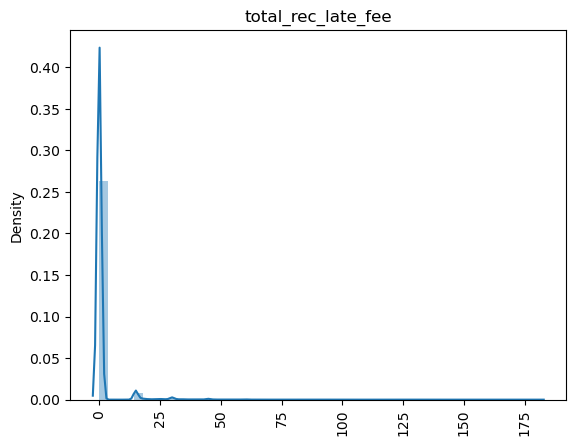

In [78]:
#sns.countplot(x='total_rec_late_fee', data=loan_data)
sns.distplot(x=loan_data['total_rec_late_fee'])
plt.title("total_rec_late_fee")
plt.xticks(rotation=90)

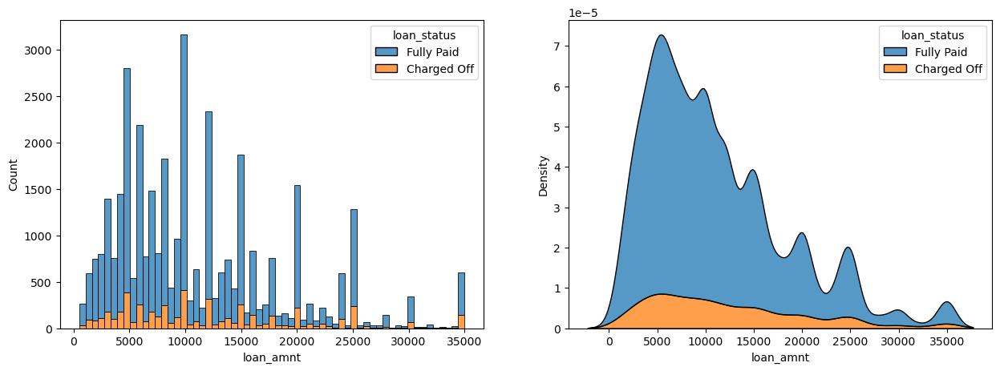

In [79]:
plot_regression_target_comparision(loan_data, col="loan_amnt")

#### Observation from above graph
## Most of the loans are from 5000-10000 loan amout range

###### Total % of defaulted loans

In [80]:
print("%.2f" % (loan_data.loc[loan_data['loan_status'] == 'Charged Off'].loan_status.count() * 100/len(loan_data)))

14.17


### Column <b style="color:Green"> loan_amount</b> Analysis

In [81]:
loan_amnt_bins= list(range(0, loan_data['loan_amnt'].max()+500, 5000))
loan_data['loan_amnt_bin']=pd.cut(loan_data['loan_amnt'], bins=loan_amnt_bins, labels=['<= 5000', '5001-10000', '10001-15000',
                            '15001-20000', '20001-25000', '25001-30000', '30001-35000'])

In [82]:
loan_data[['loan_amnt_bin', 'loan_amnt']].tail()

,loan_amnt_bin,loan_amnt
39562,<= 5000,4800
39573,5001-10000,7000
39623,5001-10000,9000
39666,15001-20000,15450
39680,<= 5000,3000


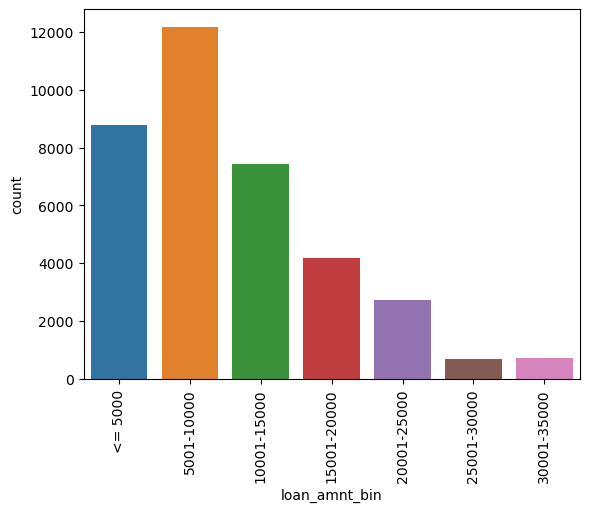

In [83]:
sns.countplot(x='loan_amnt_bin', data=loan_data)
plt.xticks(rotation=90)
plt.show()

#### Most of the loans are with loan_amnt 5000 to 10000

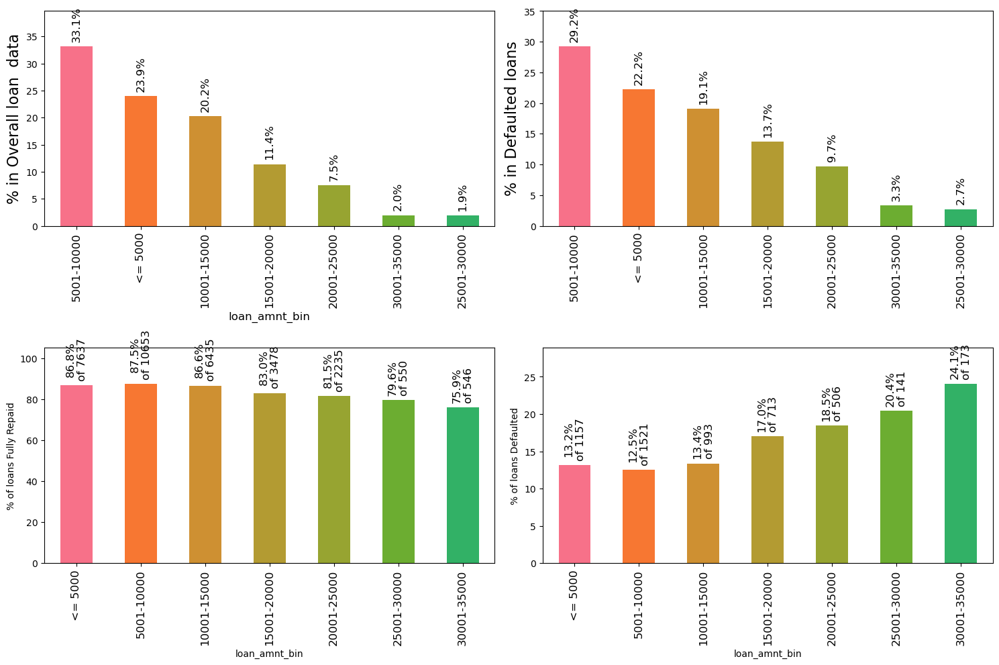

In [84]:
plot_overall_percentages_and_within_percentage(loan_data, by='loan_amnt_bin')

#### Observation for <b style="color:Green"> loan_amnt</b>
<ul>
<li>
There are more chances of dafaulers with higher loan amount.
    </li>
</ul>

##### Categorical Columns Analysis

<b style="color:Green"> term<b>

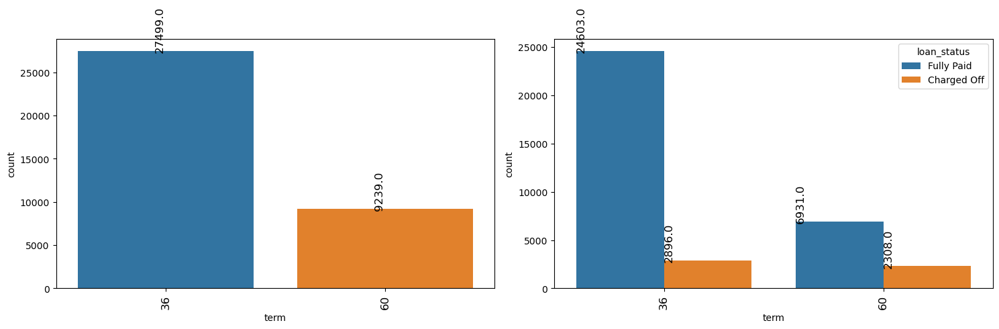

In [85]:
plot_distribution_categorical_with_target(loan_data, col='term', target="loan_status")


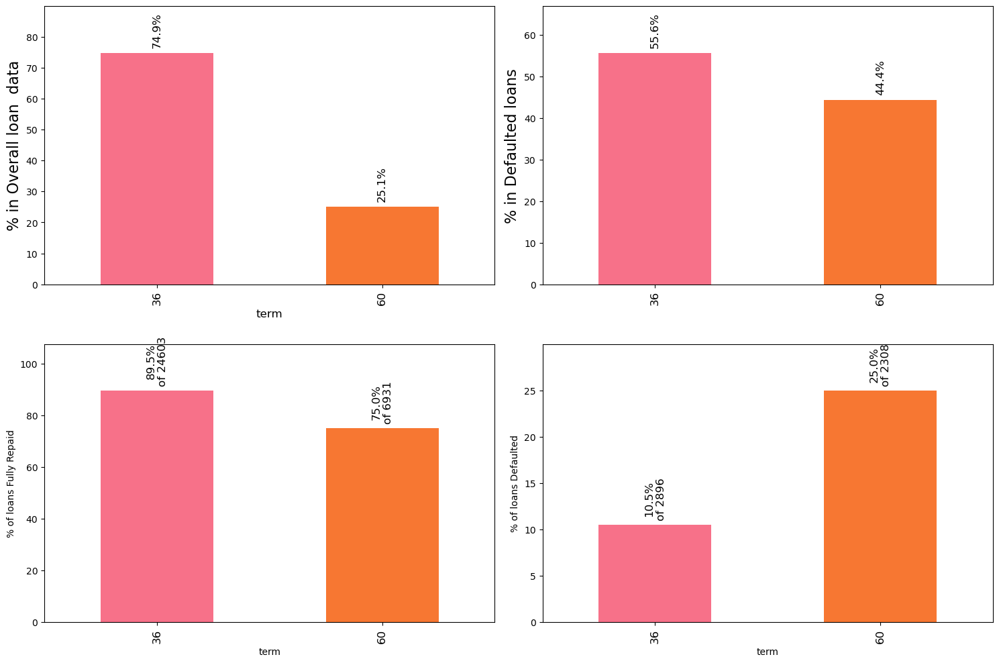

In [86]:
plot_overall_percentages_and_within_percentage(loan_data, 'term')

##### Observation 
Most of the loan taken is for term 36, for term 60 there is a lot of chances of loan getting defaulted,
25% of loan taken for term 60 is defaulted, and only 10.5% defaulted with term 36

<b style="color:Green"> grade and subgrade<b>

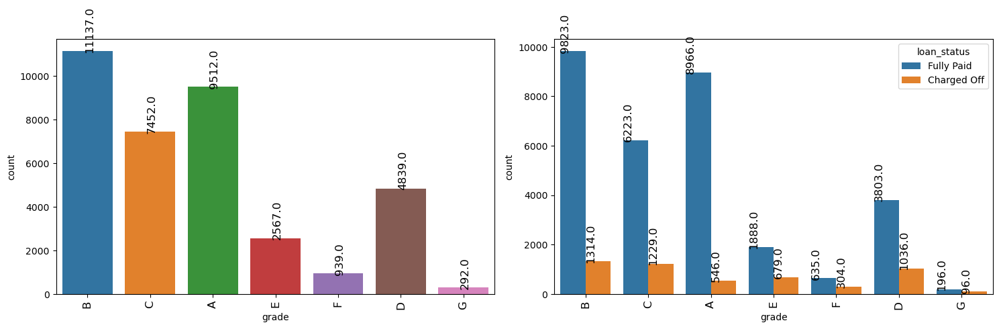

In [87]:
plot_distribution_categorical_with_target(loan_data, col='grade', target="loan_status")

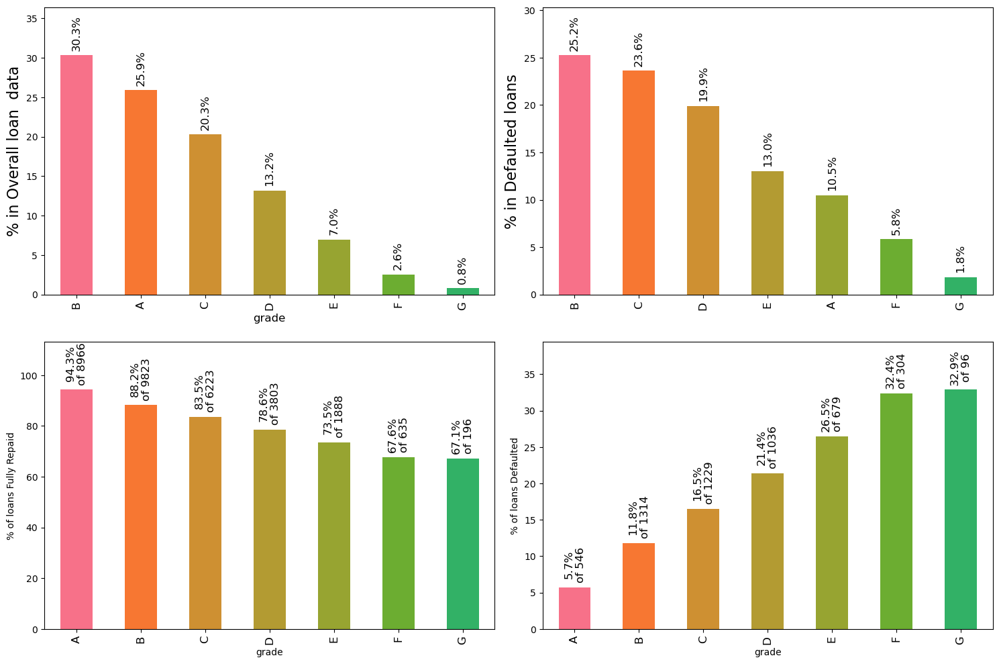

In [88]:
plot_overall_percentages_and_within_percentage(loan_data, 'grade')

#####  Observation from<b style="color:Green"> Grade :</b>
Most of the Loan approved is from GradeA to C, As the grade decline towards lower value the chances of loan getting defaulted increases. LC Grading system is good, and they graded defaulters with lower values.

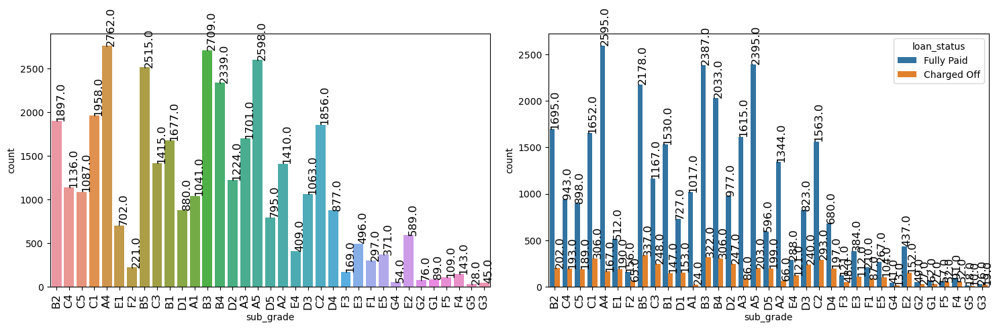

In [89]:
plot_distribution_categorical_with_target(loan_data, col='sub_grade', target="loan_status")

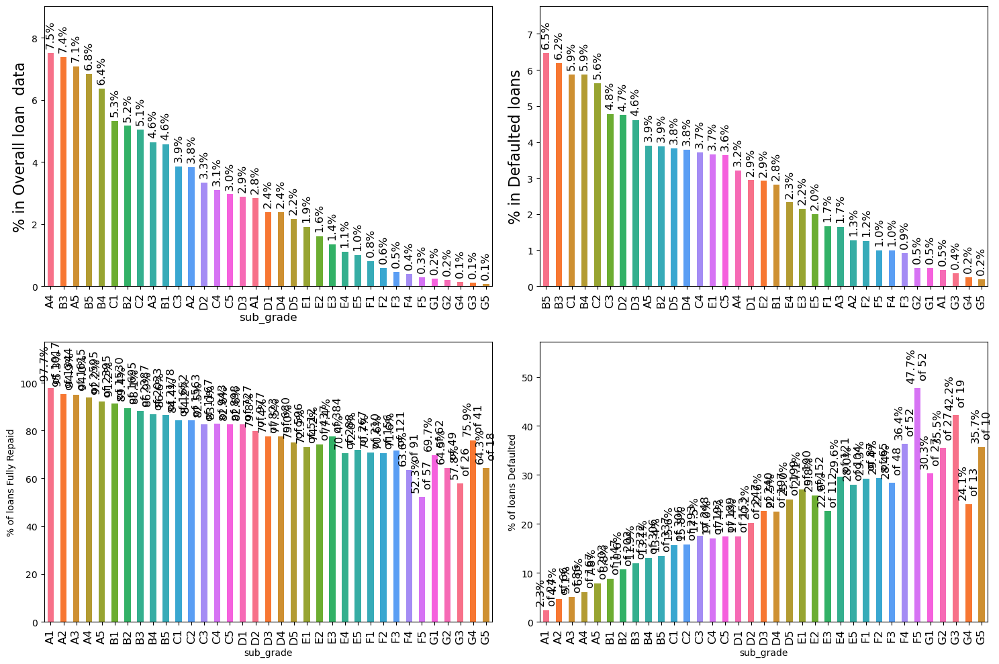

In [90]:
plot_overall_percentages_and_within_percentage(loan_data, 'sub_grade')

##### Observation <b style="color:Green"> Sub Grade</b> 
this is same as grade we see kind of same behaviour

#### Variable <b style="color:Green"> emp_title</b>

In [91]:
loan_data['emp_title'].value_counts()

There is a lot of category, but category having very less data can not give a conclusion so exclusing category with less than 30 records.
Also we see the name of Companies are not well written, same name has been written in multiple ways like U.S. Army/US Army
Removing all special characters and joining all words to get better data

In [92]:
loan_data['emp_title'] = loan_data['emp_title'].str.lower()
loan_data['emp_title'] = loan_data['emp_title'].str.replace(".","")
loan_data['emp_title'] = loan_data['emp_title'].str.replace(" ", "")
loan_data['emp_title'] = loan_data['emp_title'].str.replace("corp","")
loan_data['emp_title'] = loan_data['emp_title'].str.replace("-","")
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'jpmorganchase' if 'jpmorgan' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'jpmorganchase' if 'chasebank' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'jpmorganchase' if x=='chase' else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'bankofamerica' if 'bankofamerica' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'selfemployed' if 'self' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'wellsfargo' if 'wellsfargo' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'usairforce' if 'airforce' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'verizon' if 'verizon' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'usairforce' if x=='usaf' else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'uspostalservice' if 'postalservice' in x else x)
loan_data['emp_title'] = loan_data['emp_title'].map(lambda x: 'usarmy' if 'army' in x else x)

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\3751274838.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  loan_data['emp_title'] = loan_data['emp_title'].str.replace(".","")


In [93]:
loan_data['emp_title'].value_counts()

unknown                                                                  1362
usarmy                                                                    396
usairforce                                                                206
selfemployed                                                              171
bankofamerica                                                             154
jpmorganchase                                                             153
wellsfargo                                                                153
verizon                                                                   143
uspostalservice                                                           125
walmart                                                                   110
at&t                                                                       82
ibm                                                                        70
kaiserpermanente                                                

In [94]:
loan_data_emp_title = loan_data[loan_data['emp_title'].map(loan_data['emp_title'].value_counts()) > 30]

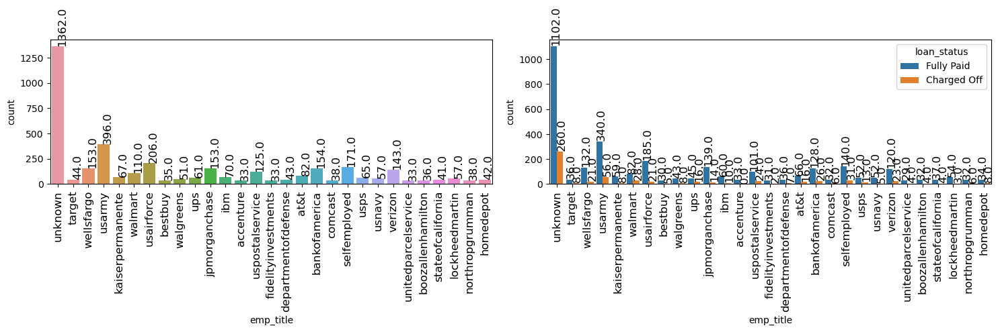

In [95]:
plot_distribution_categorical_with_target(loan_data_emp_title, col='emp_title', target="loan_status")

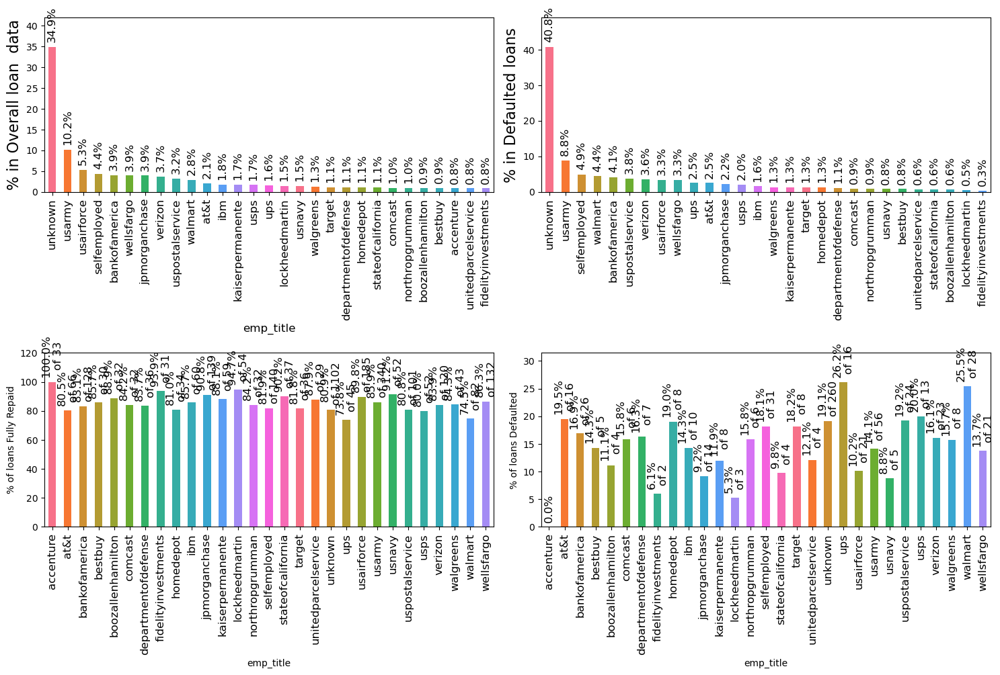

In [96]:
plot_overall_percentages_and_within_percentage(loan_data_emp_title, 'emp_title')

#### Observation for <b style="color:Green"> emp_title</b>
<ul>
<li>
Employer title is not entered perfectly, same company has been entered in differnt ways. LC should have some lookup to fix this problem.
</li>
    <li>
        Before fixing emp_title name issue, we can see maximum number of loans given to borrower with Unknown employer. and then US Army and then Bank of America. 
    </li>
<li>After fixing the above issue to an extent, Unknown is still on the highest number, which should be looked into why its Unknown. US Army is still at 2nd place but now 3rd place is taken by US Airforce. Then Self Employed and then Bank of America.
</li>
<li>
    We find that borrower from Walmart and UPS have higher chances(around 25-26%) of defaulters.
</li>
    <li>
        Borrowers from Accenture have 100% Fully paid loans, which is very good sign from Accenture employee.
    </li>
</ul>

##### Variable <b style="color:Green"> Employment Length</b> 

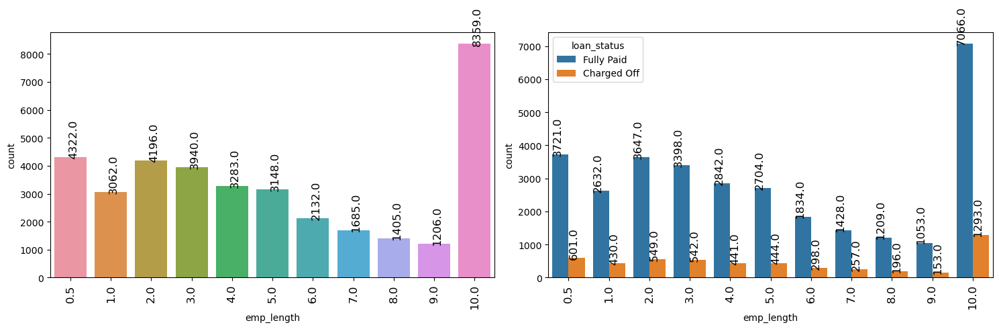

In [97]:
plot_distribution_categorical_with_target(loan_data, col='emp_length', target="loan_status")

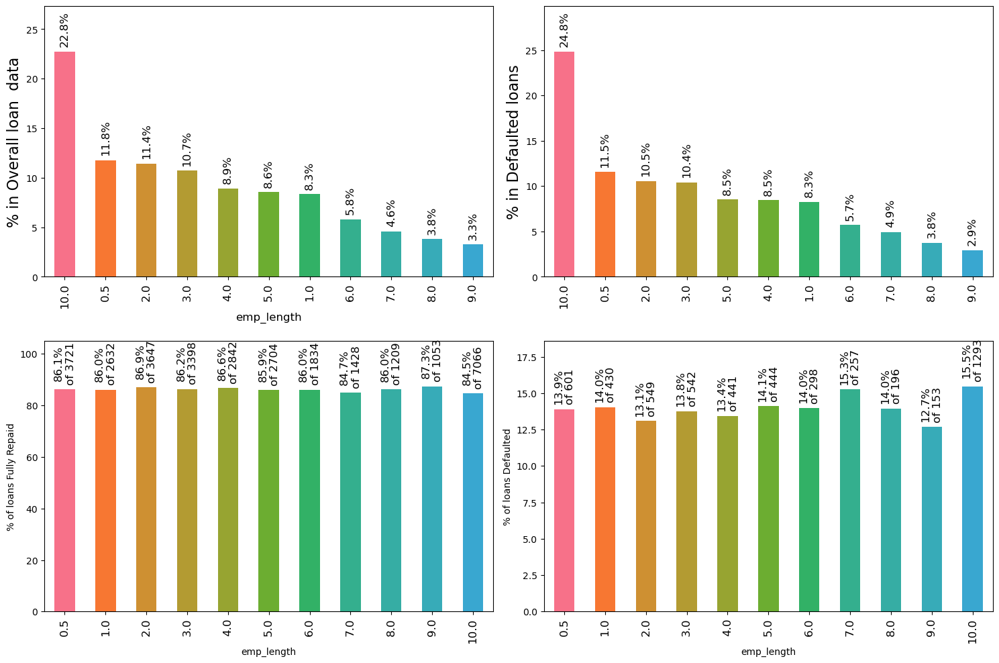

In [98]:
plot_overall_percentages_and_within_percentage(loan_data, 'emp_length')

#### Observation for <b style="color:Green"> emp_length</b>
<ul>
<li>
Maximum loans given to borrowers having 10+ employment history, This may also because 10+ is a larger range than other employment buckets.
</li>
    <li>
    Least number of loans given to borrowers with around 9 years employment length.
</li>
<li>
    From each bucket we see the defaulters percentage varies between 13-15%.
</li>
<li>We do not see much changes in % of defaulters with different employment length. SO looks like employment length do not have much effect on loan defaulters.
</li>
</ul>

#### Variable <b style="color:Green"> home_ownership</b>

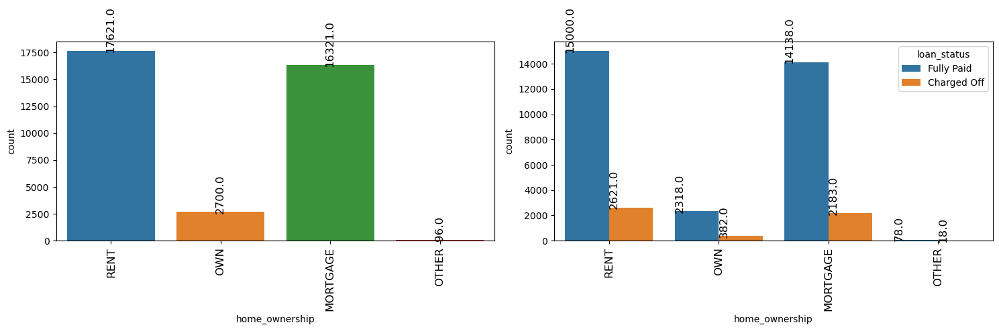

In [99]:
plot_distribution_categorical_with_target(loan_data, col='home_ownership', target="loan_status")


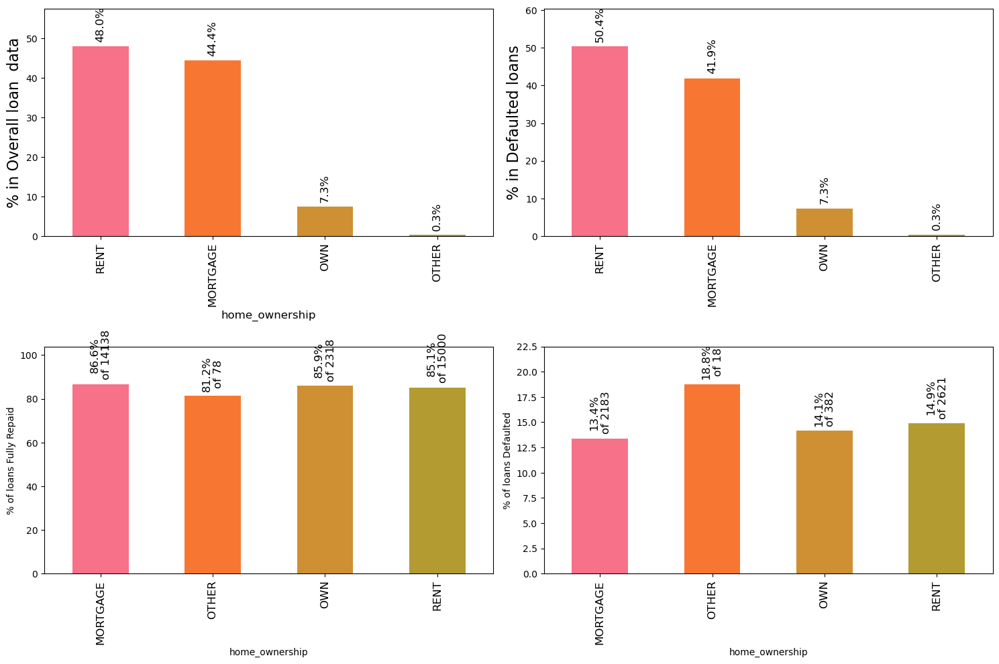

In [100]:
plot_overall_percentages_and_within_percentage(loan_data, 'home_ownership')

#### Observation for <b style="color:Green"> home_ownership</b>
<ul>
<li>
Maximum loans given to borrowers from home_ownership as RENT or MORTGAGE. Very few from others.
</li>
<li>
    Though there is not much variation in Defaulters, it only varies from 13-19%. But still we see 18.8% as maximum deafulters from Other category.
</li>
<li>
    As there is very less variation, looks like this does not contribute towards a defaulted loans.  
</li>
</ul>

#### Variable <b style="color:Green"> verification_status</b>

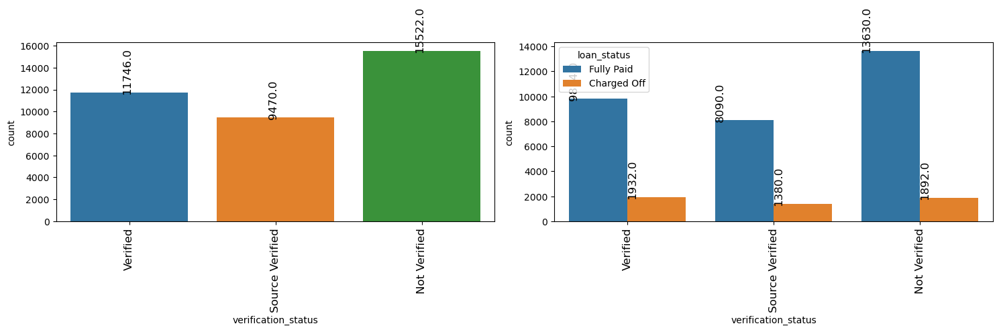

In [101]:
plot_distribution_categorical_with_target(loan_data, col='verification_status', target="loan_status")

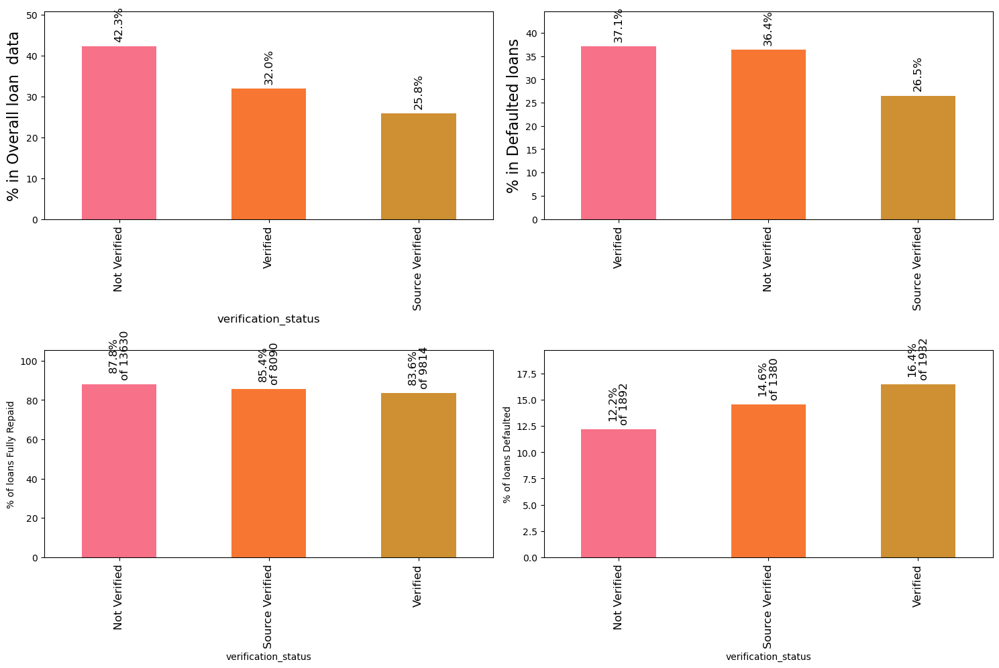

In [102]:
plot_overall_percentages_and_within_percentage(loan_data, 'verification_status')

#### Observation for <b style="color:Green"> verification_status</b>
<ul>
<li>
There is a lot of loans given to borrowers are from category Not Verified, which is a concern. LC should verify loans.
</li>
<li>
    percentage of Charged off loans from Verified category is higher than Not Verified and Source Verified, which should not be the case.
</li>
<li>
    Not verified have leans percentage of defaulters
</li>
</ul>

verification_status as Verified and Source Verified can of same type, lets combine both of them and then again analyze data

In [103]:
loan_data['verification_status'] = loan_data['verification_status'].apply(lambda x: "Not Verified" if x=="Not Verified" else "Verified")

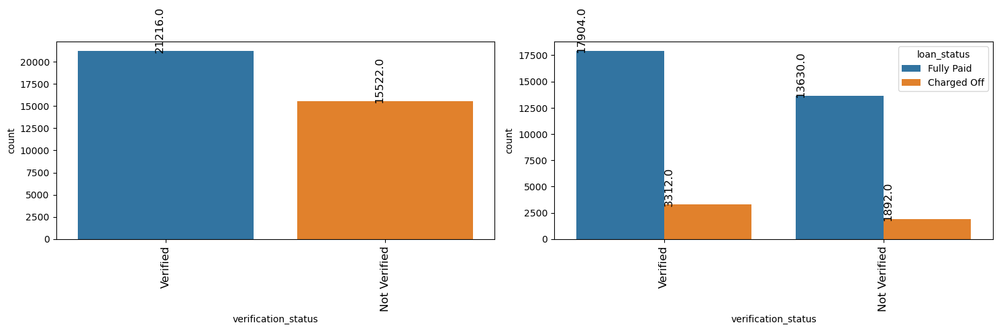

In [104]:
plot_distribution_categorical_with_target(loan_data, col='verification_status', target="loan_status")

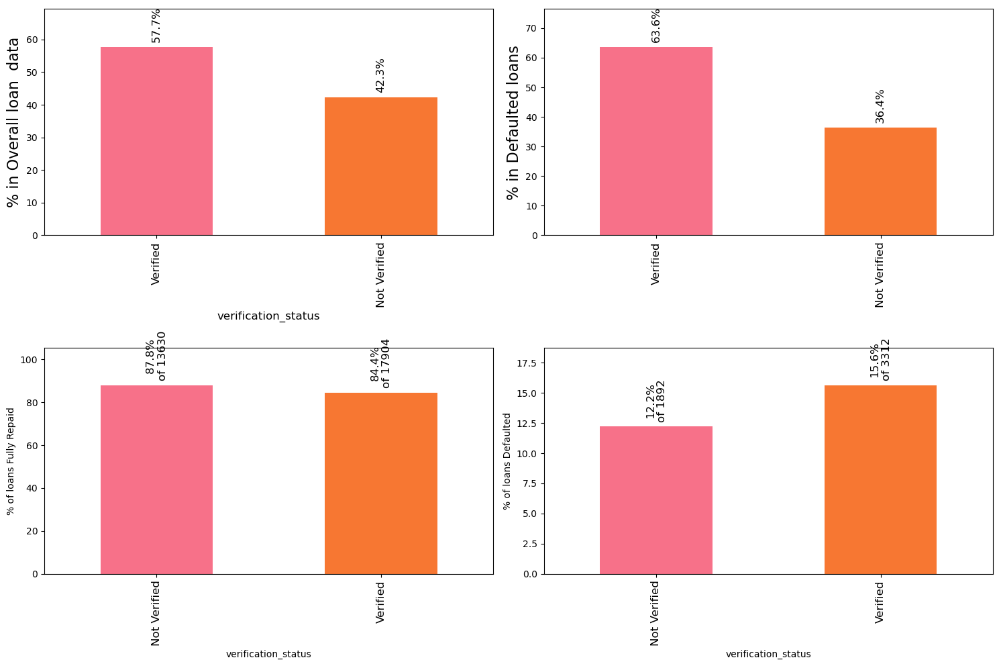

In [105]:
plot_overall_percentages_and_within_percentage(loan_data, 'verification_status')

#### Observation for <b style="color:Green"> verification_status </b> after combining Verified and Source Verified
<ul>
<li>
    Now we see more Loans a verified than Not Verified but still Not Verified loans a high in numbers, which should be taken care by LC

</li>
<li>
    We still see there is higher percentage of defaulters from Verified loans, and less from Not Verified. Which is little unexpected.
</li>

</ul>

#### Variable <b style="color:Green"> purpose</b>

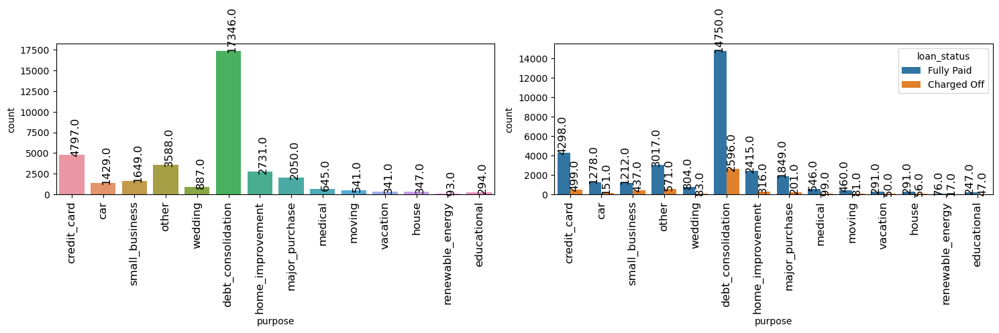

In [106]:
plot_distribution_categorical_with_target(loan_data, col='purpose', target="loan_status")

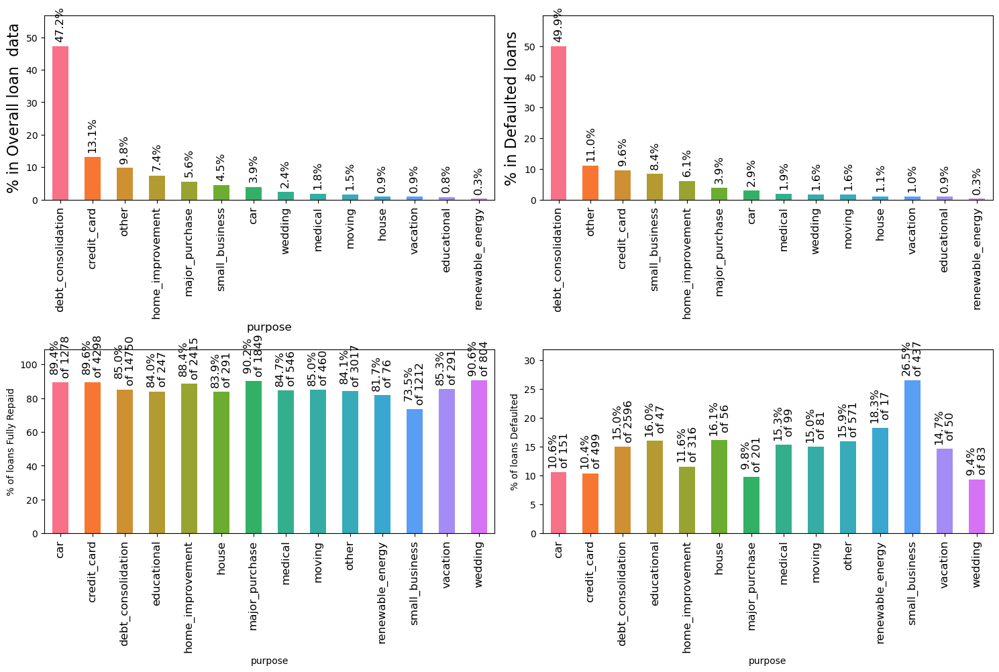

In [107]:
plot_overall_percentages_and_within_percentage(loan_data, 'purpose')

#### Observation for <b style="color:Green"> purpose</b>
<ul>
<li>
Maximum loans given to borrowers are for debt_consolidation and then for credit_card then home_improvements and so on.
</li>
<li>Maximum percentage of Charged off loans are from small_business(26.5%), which means loans taken for small business have higher chances of getting Charged Off.
</li>
<li>Then renewable energy also have higher chances at around 18% to get chanrged off.
</li>
 <li>Loans taken for wedding and major purchase have least chances(around 9%) of getting charged of.
</li>
</ul>

#### Variable <b style="color:Green"> title</b>

In [108]:
loan_data['title'].value_counts()

Debt Consolidation                                                                  2028
Debt Consolidation Loan                                                             1578
Personal Loan                                                                        598
Consolidation                                                                        472
debt consolidation                                                                   453
Credit Card Consolidation                                                            333
Home Improvement                                                                     332
Debt consolidation                                                                   306
Small Business Loan                                                                  292
Credit Card Loan                                                                     289
Personal                                                                             287
Consolidation Loan   

In [109]:
loan_data.drop(columns=["title"], axis=1, inplace=True)

#### Observation for <b style="color:Green"> title</b>
<ul>
<li>
Title and purpose looks highly correlated, so we are excluding title from our analysis
</li>
</ul>

#### Variable <b style="color:Green"> addr_state</b>

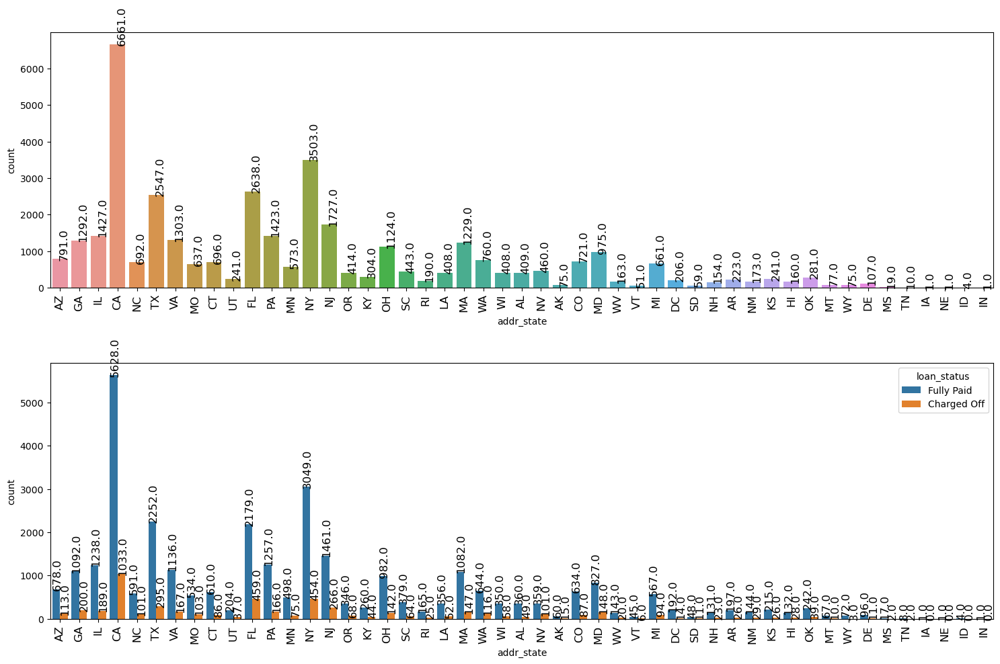

In [110]:
plot_distribution_categorical_with_target(loan_data, col='addr_state', target="loan_status",fig_size=(15,10),vertical=True)

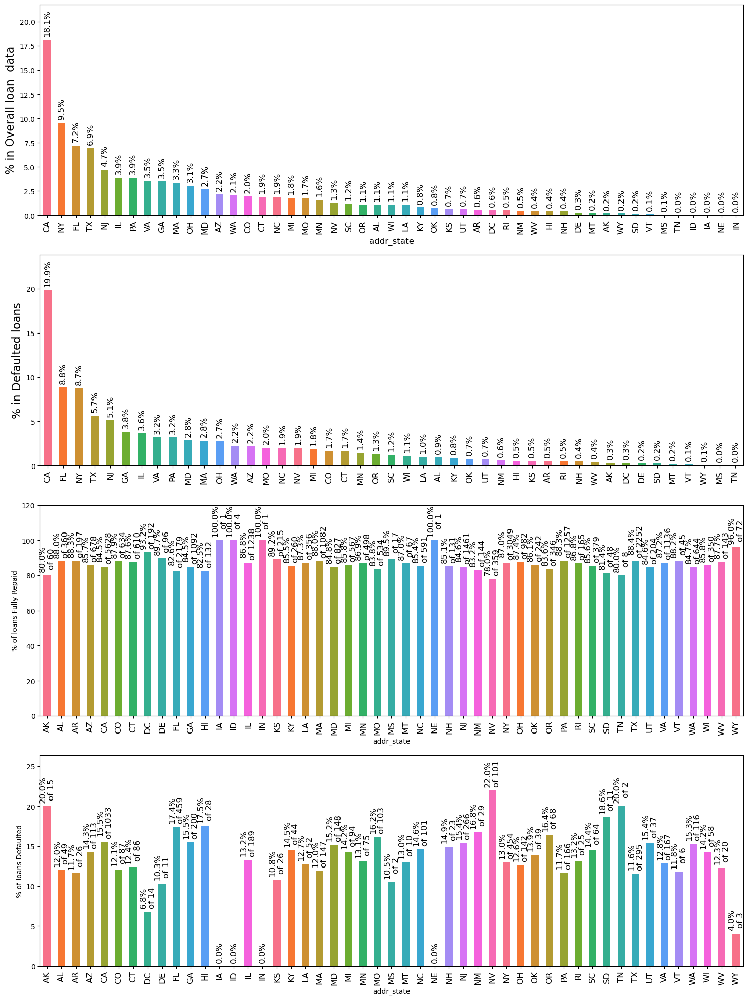

In [111]:
plot_overall_percentages_and_within_percentage(loan_data, 'addr_state',fig_size=(15,20),vertical=True)

#### Observation for <b style="color:Green"> addr_state</b>
<ul>
<li>
Accepted loans from State CA is highest in number. And then from NY
</li>
<li>IA, NE, ID and IN have very few loans accepted.
</li>
<li>Borrowers from NV/AK/TN have higher chances of defaulters (around 22-20%) 
</li>
  <li>Borrowers from IA/ID and NE we have 100% repaid loans, but also they had only 1 loan approved so very less confidence of 100% repay.
</li>  
</ul>

There is a lot of states, but states having very less data can not give a conclusion so exclusing states with less than 50 records.

In [112]:
loan_data_addr_state = loan_data[loan_data['addr_state'].map(loan_data['addr_state'].value_counts()) > 50]

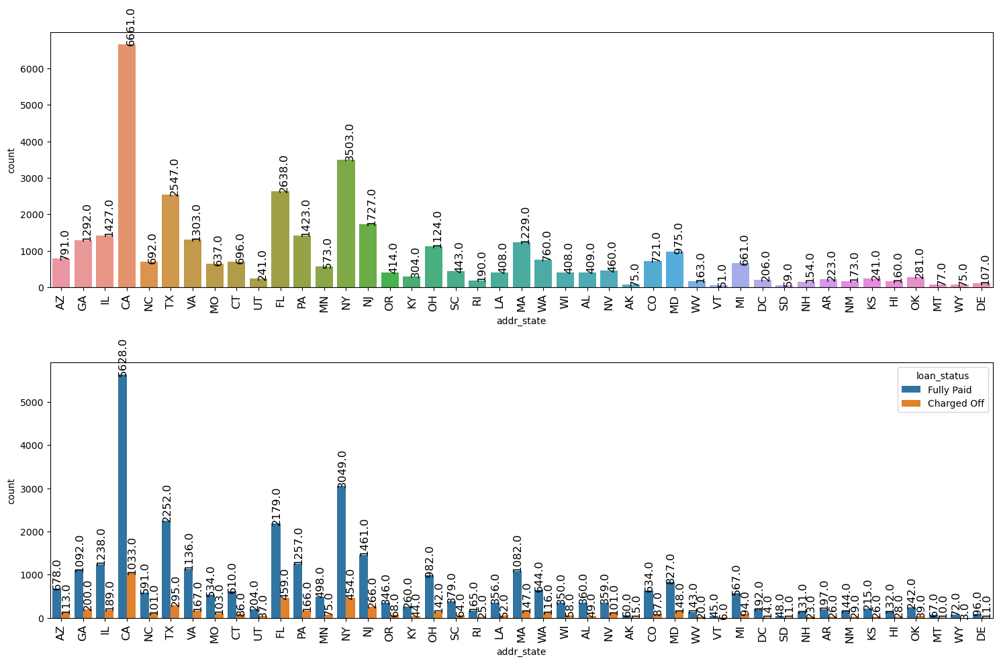

In [113]:
plot_distribution_categorical_with_target(loan_data_addr_state, col='addr_state', target="loan_status",fig_size=(15,10),vertical=True)

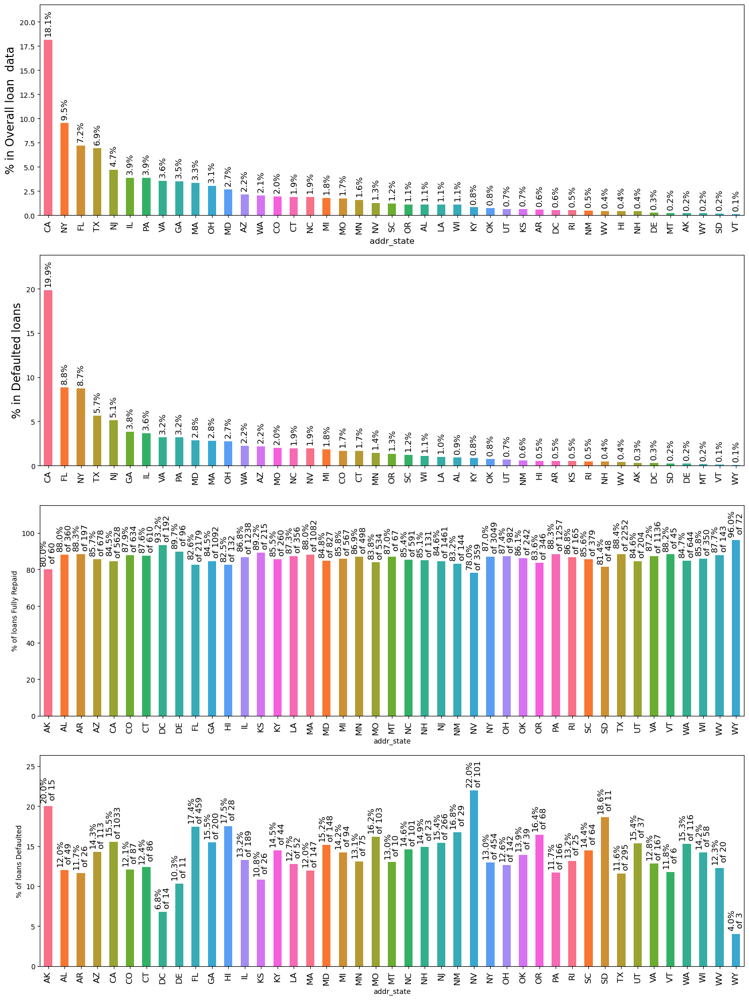

In [114]:
plot_overall_percentages_and_within_percentage(loan_data_addr_state, 'addr_state',fig_size=(15,20),vertical=True)

#### Variable <b style="color:Green"> issue_d_year</b>

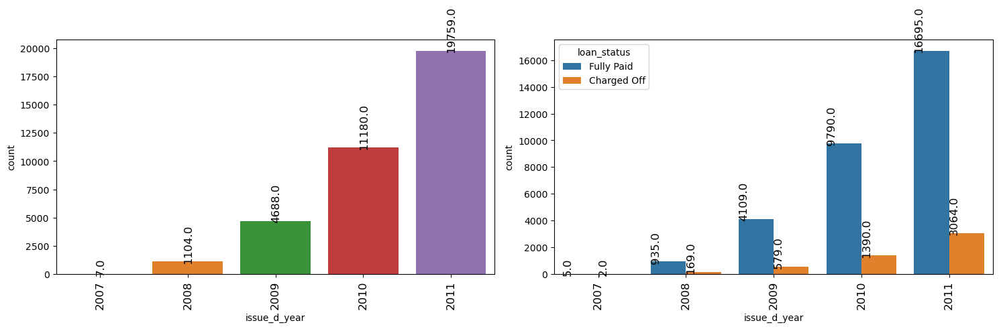

In [115]:
plot_distribution_categorical_with_target(loan_data, col='issue_d_year', target="loan_status")

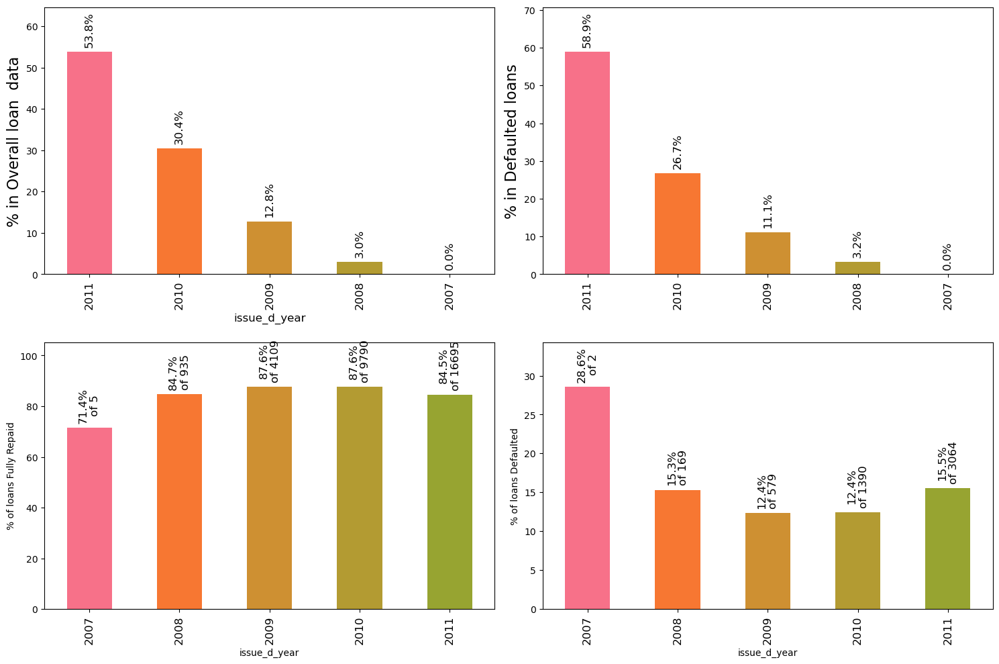

In [116]:
plot_overall_percentages_and_within_percentage(loan_data, 'issue_d_year')

#### Observation for <b style="color:Green"> issue_d_year</b>
<ul>
<li>
LC ad very few borrowers from 2007, and its increasing year by year, which is good sign.
</li>
<li>We had around 30% defaulters in 2007, which may be because LC started the same year and process was not streamlined.
</li>
<li>Other years percentage of defaulters are almost similar, so no effect of Year.
</li>
</ul>

#### Variable <b style="color:Green"> issue_d_month</b>

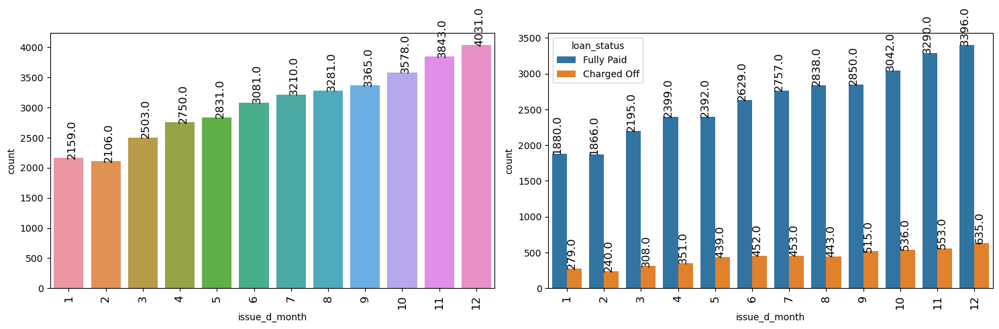

In [117]:
plot_distribution_categorical_with_target(loan_data, col='issue_d_month', target="loan_status")

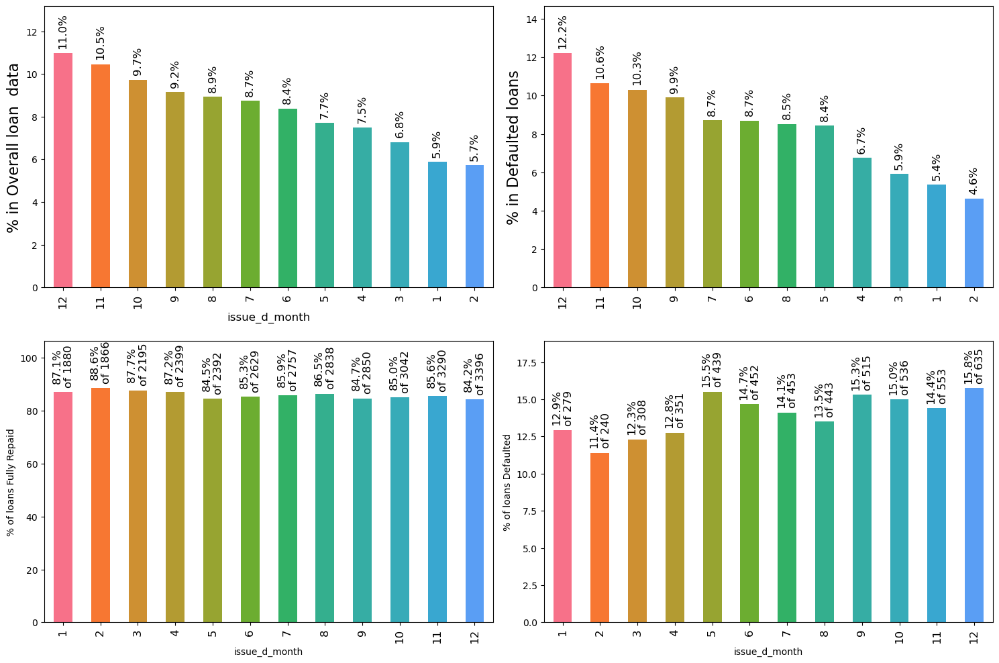

In [118]:
plot_overall_percentages_and_within_percentage(loan_data, 'issue_d_month')

#### Observation for <b style="color:Green"> issue_d_month</b>
<ul>
<li>
There is a trend that number of approved loans increases from Jan to Dec.
</li>
<li>Number of defaulters from each issued month is almost similar no effect on loan_status.
</li>

</ul>

#### Variable <b style="color:Green"> pub_rec_bankruptcies</b>

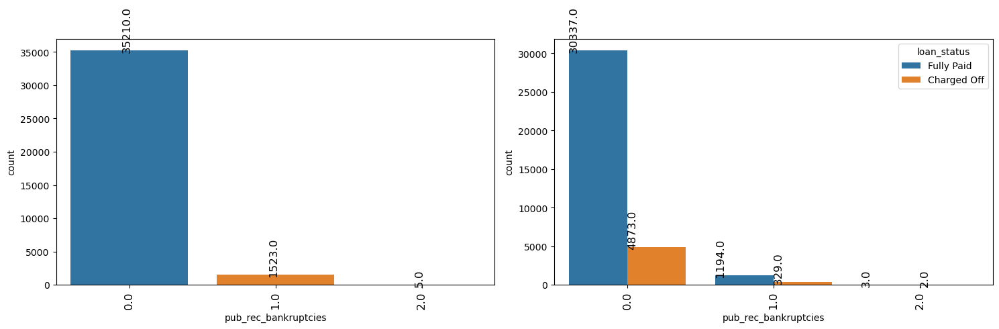

In [119]:
plot_distribution_categorical_with_target(loan_data, col='pub_rec_bankruptcies', target="loan_status")

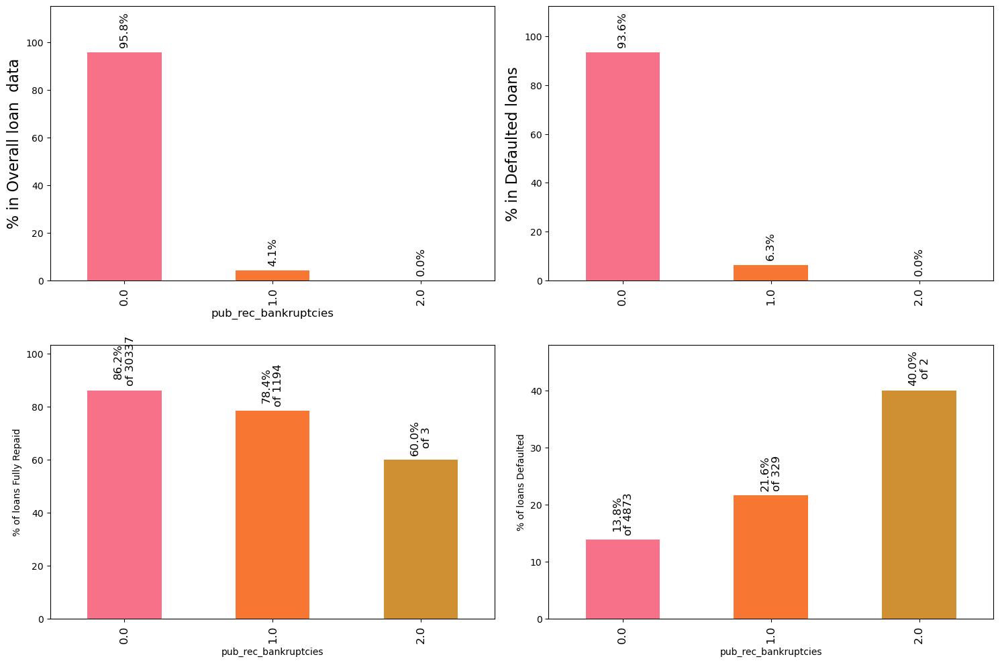

In [120]:
plot_overall_percentages_and_within_percentage(loan_data, 'pub_rec_bankruptcies')

#### Observation for <b style="color:Green"> pub_rec_bankruptcies</b>
<ul>
<li>
Very few loans have been approved to borrower with history of bankruptcies, LC is doing good to not approve loans for these borrowers.
</li>
<li>There is very high chances of Charged off loans with higher number of bankruptcy history. LC has to be very careful to give loans to borrowers with earlier bankruptcies.
</li>

</ul>

#### Regression Variable <b style="color:Green"> int_rate</b>

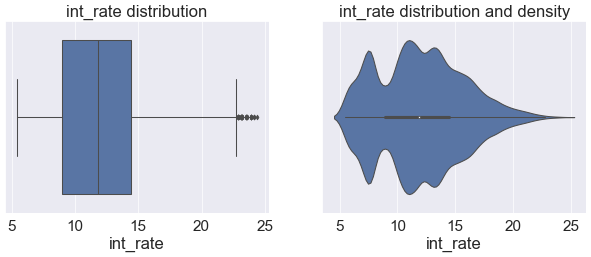

In [121]:
univariate_regression(loan_data, 'int_rate')

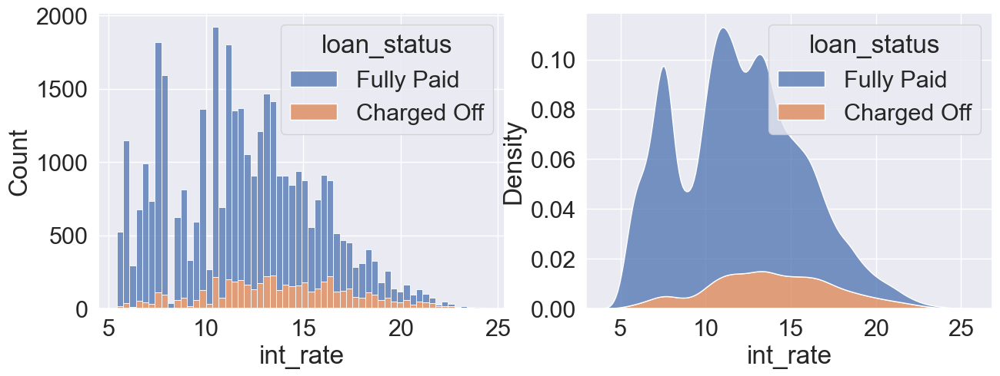

In [122]:
plot_regression_target_comparision(data=loan_data, target="loan_status", col='int_rate')

Lets create bins and analyze interest rate per bin

In [123]:
list(range(5, int(loan_data['int_rate'].max())+4, 5))

[5, 10, 15, 20, 25]

In [124]:
int_rate_bins= list(range(5, int(loan_data['int_rate'].max())+4, 5))
loan_data['int_rate_bin']=pd.cut(loan_data['int_rate'], bins=int_rate_bins, labels=['5-10', '11-15',
                            '16-20', '21-25'])

In [125]:
loan_data[['int_rate','int_rate_bin']].head(10)

,int_rate,int_rate_bin
0,10.65,11-15
1,15.27,16-20
2,15.96,16-20
3,13.49,11-15
5,7.90,5-10
6,15.96,16-20
7,18.64,16-20
8,21.28,21-25
9,12.69,11-15
10,14.65,11-15


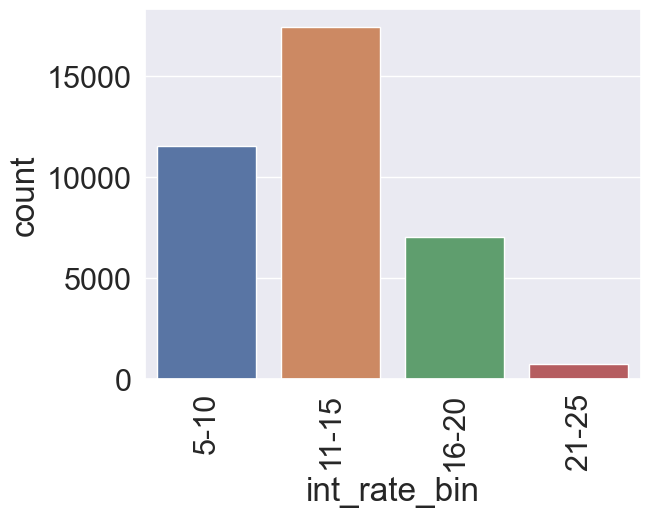

In [126]:
sns.countplot(x='int_rate_bin', data=loan_data)
plt.xticks(rotation=90)
plt.show()

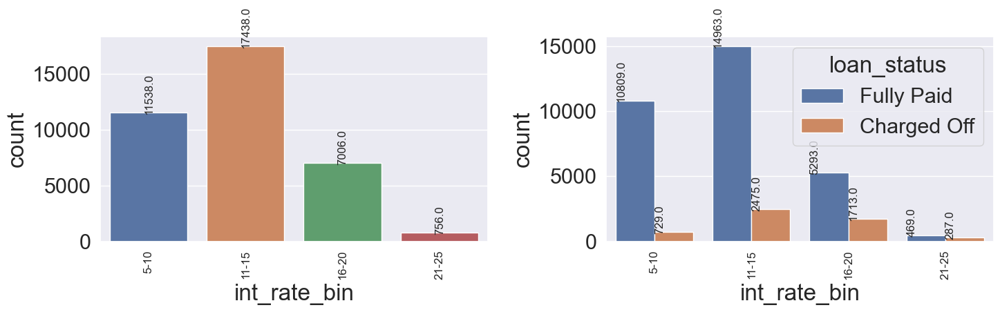

In [127]:
plot_distribution_categorical_with_target(loan_data, col='int_rate_bin', target="loan_status")

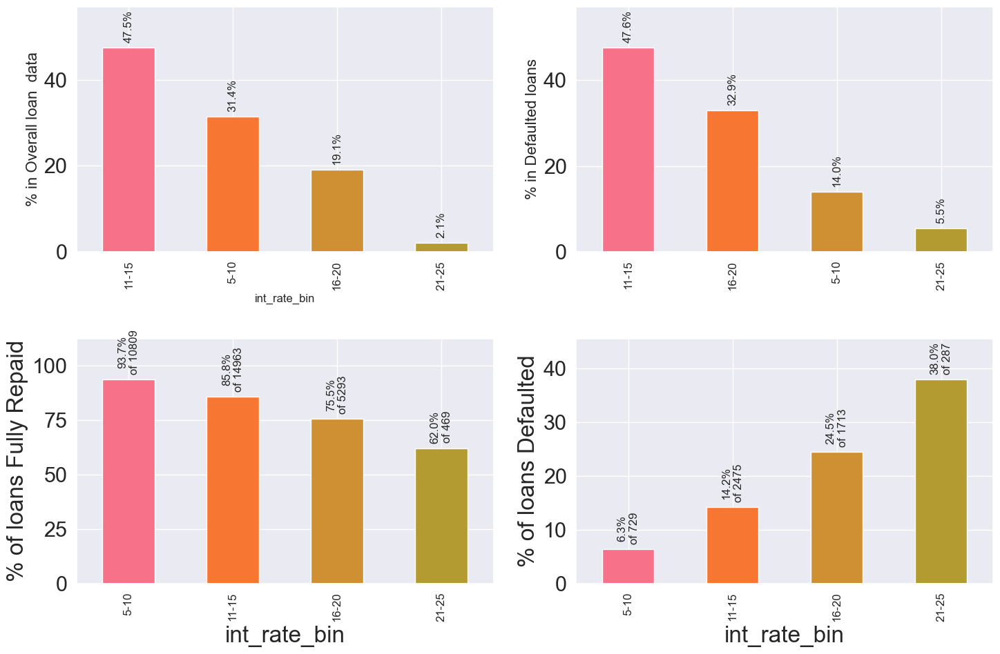

In [128]:
plot_overall_percentages_and_within_percentage(loan_data, 'int_rate_bin')

#### Observation for <b style="color:Green"> int_rate</b>
<ul>
<li>
Most of the loan interest rate range between 11-15%
</li>
<li>Some outliars we can see in boxplot, which may be valid interest rate for few loan types.
</li>

<li>There is a interesting trend where we see as the inerest rate increases chances of Charged Off loan is also increasing.
</li>
</ul>

#### Variable <b style="color:Green"> installment</b>

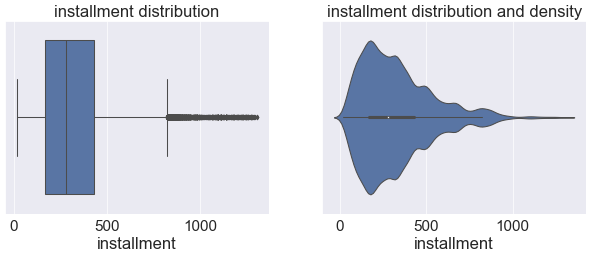

In [129]:
univariate_regression(loan_data, 'installment')

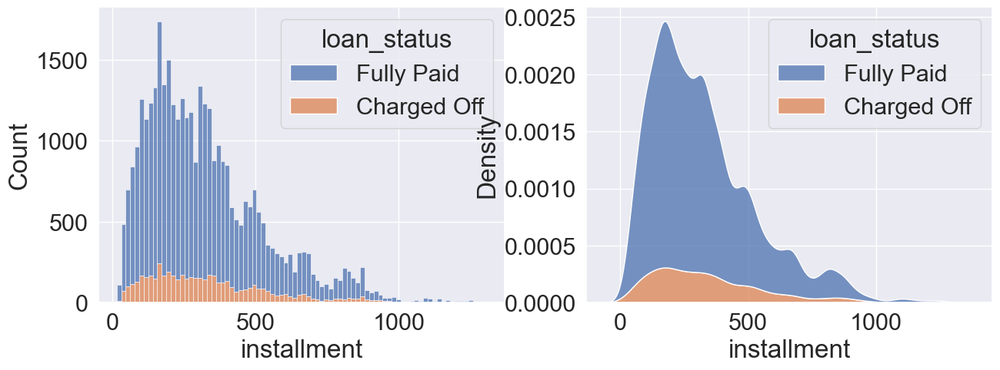

In [130]:
plot_regression_target_comparision(data=loan_data, target="loan_status", col='installment')


In [131]:
loan_data['installment'].describe()

count    36738.000000
mean       324.989183
std        208.837607
min         16.080000
25%        167.730000
50%        280.280000
75%        429.450000
max       1305.190000
Name: installment, dtype: float64

In [132]:
list(range(0, int(loan_data['installment'].max()+99), 100))

[0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400]

In [133]:
installment_bins= list(range(0, int(loan_data['installment'].max()+99), 100))
installment_lable=['100', '200', '300', '400', '500', '600', '700', '800', '900', '1000', '1100', '1200', '1300','1400']
loan_data['installment_bin']=pd.cut(loan_data['installment'], bins=installment_bins, labels=installment_lable)

In [134]:
loan_data[loan_data['installment']>1300][['installment','installment_bin']].tail()

,installment,installment_bin
12140,1305.19,1400
16152,1302.69,1400


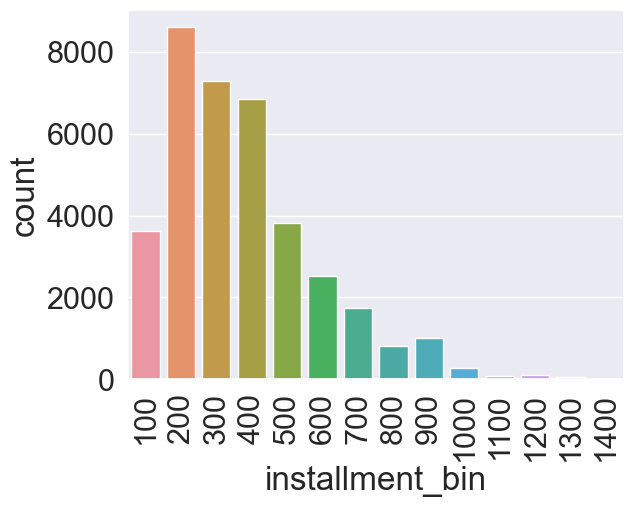

In [135]:
sns.countplot(x='installment_bin', data=loan_data)
plt.xticks(rotation=90)
plt.show()

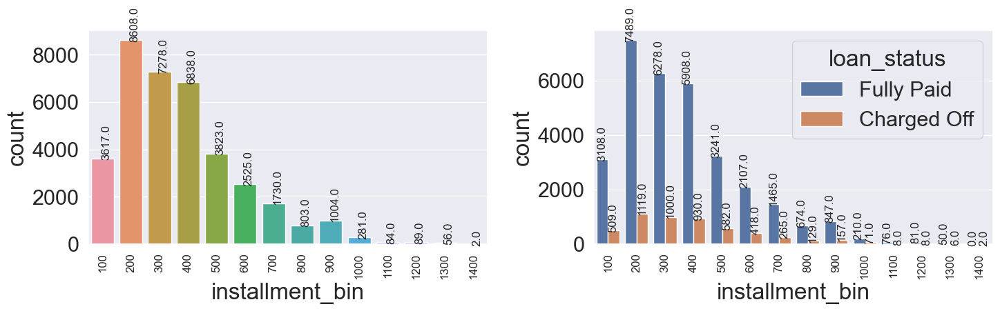

In [136]:
plot_distribution_categorical_with_target(loan_data, col='installment_bin', target="loan_status")

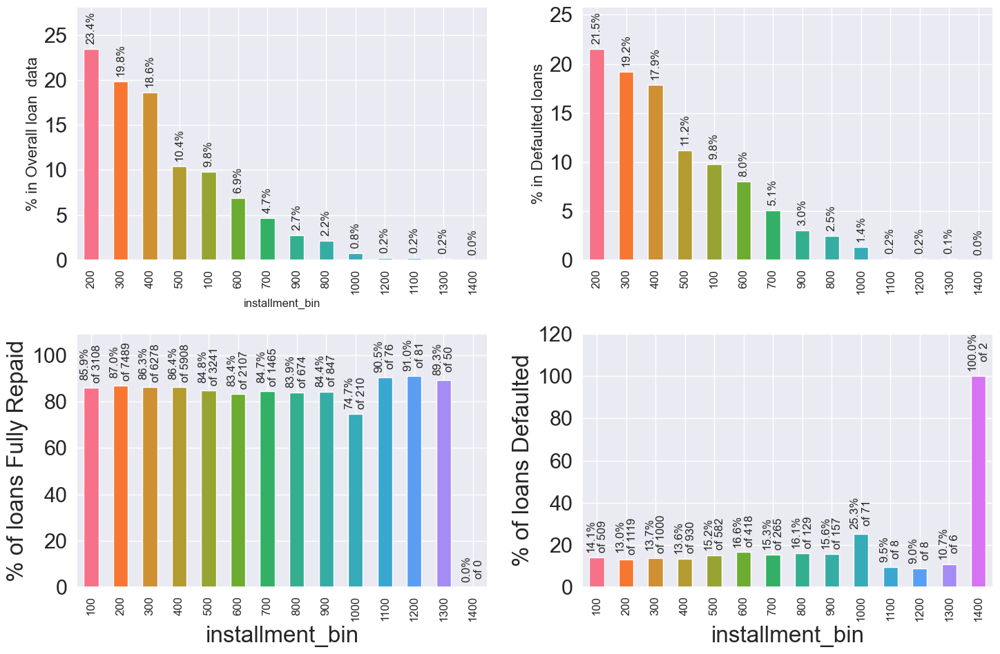

In [137]:
plot_overall_percentages_and_within_percentage(loan_data, 'installment_bin')

#### Observation for <b style="color:Green"> installment</b>
<ul>
<li>
installment value mostly lies somewhere between 200-500
</li>
<li>Looking at the percentage graph, looks like installment do not have much effect on loan status, except installment between 900-1000 where we see 25% charged Off loans. 
</li>

<li>Installment above 1300 are always defaulters, but there are only 2 such records so less confidence.
</li>
</ul>

#### Variable <b style="color:Green"> annual_inc</b>

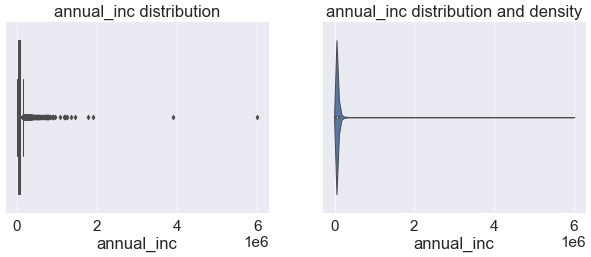

In [138]:
univariate_regression(loan_data, 'annual_inc')

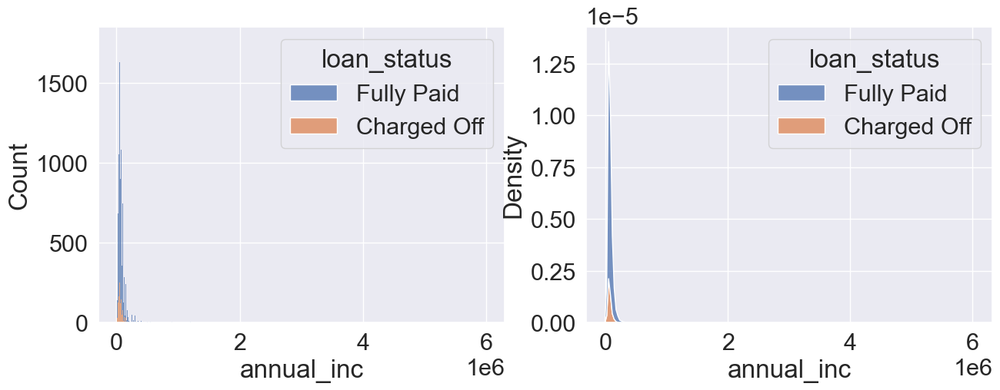

In [139]:
plot_regression_target_comparision(data=loan_data, target="loan_status", col='annual_inc')

<Axes: xlabel='annual_inc'>

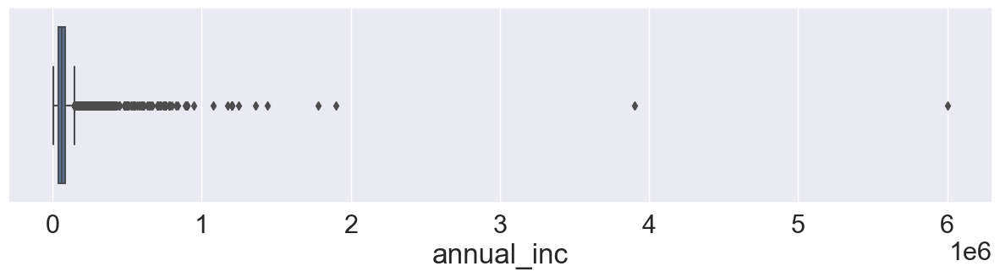

In [140]:
plt.figure(figsize=(15, 3))
sns.boxplot(x=loan_data['annual_inc'], data=loan_data)

<Axes: xlabel='annual_inc'>

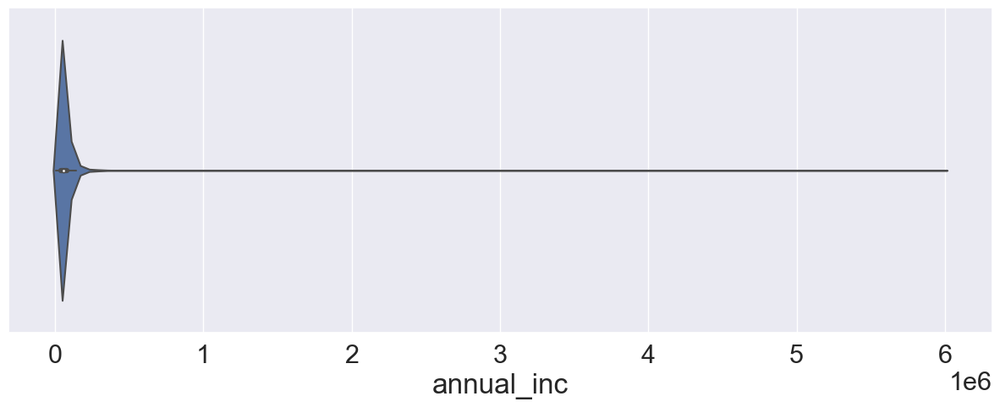

In [141]:
plt.figure(figsize=(15, 5))
sns.violinplot(x=loan_data['annual_inc'], data=loan_data)

In [142]:
loan_data['annual_inc'].describe()

count    3.673800e+04
mean     6.946795e+04
std      6.406184e+04
min      4.000000e+03
25%      4.120000e+04
50%      6.000000e+04
75%      8.300000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

The annual income reprted by the borrowers range from min of 4,000 to max of 6,000,000. There are clearly people with distinctly large income who applying for relatively small loans (up to a maximum of 35,000).
Median annual income is around 60,000
Most people have an annual income less than 115000

In [143]:
# Let's get rid of outliers to analyze annual income. 
# Keep only the ones that are within +3 to -3 standard deviations in the column 'Data'.
loan_data_annual_inc = loan_data[np.abs(loan_data.annual_inc-loan_data.annual_inc.mean()) <= (3*loan_data.annual_inc.std())]

In [144]:
loan_data_annual_inc['annual_inc'].describe()

count     36471.000000
mean      66534.594044
std       36341.109875
min        4000.000000
25%       41000.000000
50%       59796.000000
75%       82000.000000
max      260735.000000
Name: annual_inc, dtype: float64

In [145]:
list(range(0, int(loan_data_annual_inc['annual_inc'].max()+900), 10000))

[0,
 10000,
 20000,
 30000,
 40000,
 50000,
 60000,
 70000,
 80000,
 90000,
 100000,
 110000,
 120000,
 130000,
 140000,
 150000,
 160000,
 170000,
 180000,
 190000,
 200000,
 210000,
 220000,
 230000,
 240000,
 250000,
 260000]

Created bins with label less than the number 

In [146]:
annual_inc_bins= list(range(0, int(loan_data_annual_inc['annual_inc'].max()+9000), 10000))
annual_inc_lables = [str(x) for x in annual_inc_bins[1:]]
loan_data_annual_inc['annual_inc_bin']=pd.cut(loan_data_annual_inc['annual_inc'], bins=annual_inc_bins, labels=annual_inc_lables)

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\1144005210.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_annual_inc['annual_inc_bin']=pd.cut(loan_data_annual_inc['annual_inc'], bins=annual_inc_bins, labels=annual_inc_lables)


In [147]:
loan_data_annual_inc[loan_data_annual_inc['annual_inc'] > 5000000][['annual_inc_bin','annual_inc']].tail()

,annual_inc_bin,annual_inc


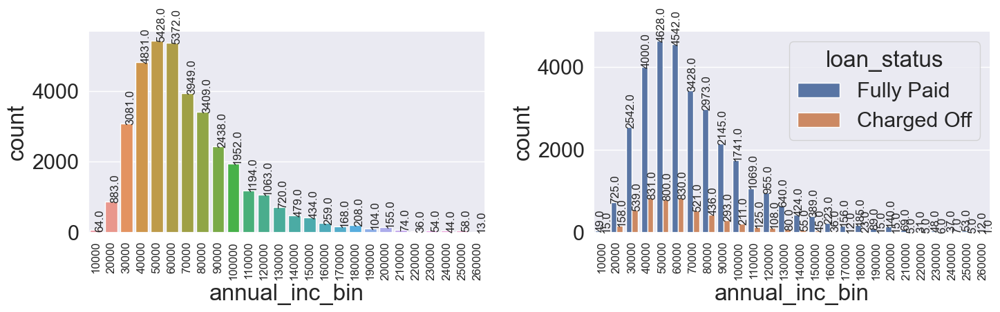

In [148]:
plot_distribution_categorical_with_target(loan_data_annual_inc, col='annual_inc_bin', target="loan_status", annotate=True)

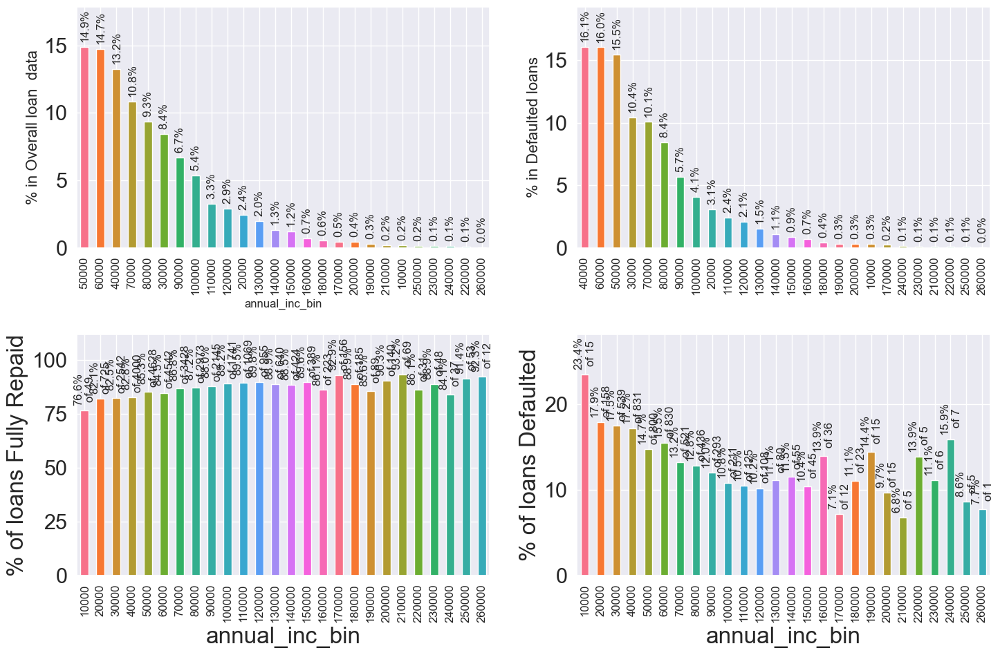

In [149]:
plot_overall_percentages_and_within_percentage(loan_data_annual_inc, 'annual_inc_bin', annotate=True)

#### Observation for <b style="color:Green"> annual_inc</b>
<ul>
<li>
Annual Income have Outliars which is affecting mean, but it is possible to have borrower with very high income
</li>
<li>Most of the Borrowers having Annual income between 30k to 60K
</li>
<li>Chances of loan Charge Off is more in case of low income below 10k
</li>
</ul>


#### Variable <b style="color:Green"> dti </b>
A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.


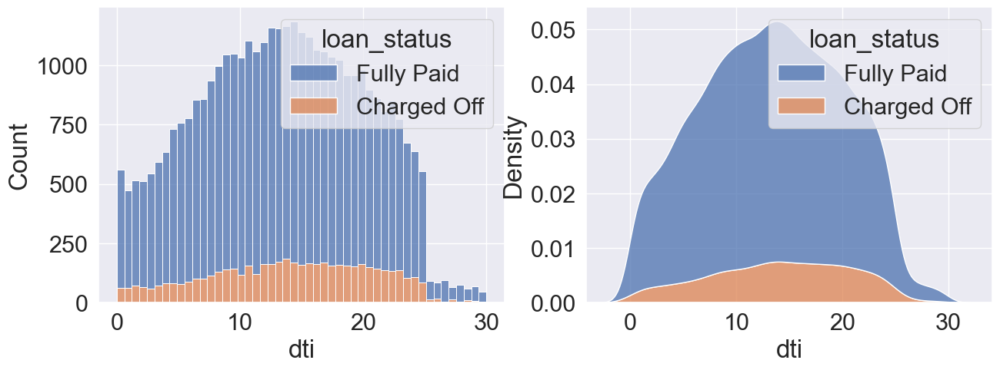

In [150]:

plot_regression_target_comparision(data=loan_data, target="loan_status", col='dti')

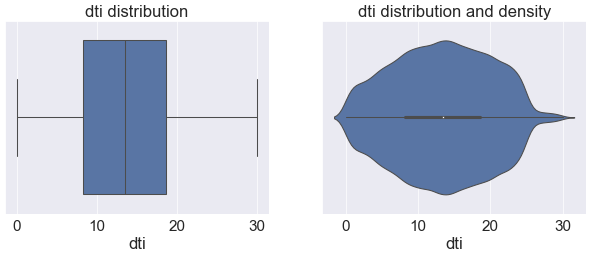

In [151]:
univariate_regression(loan_data, 'dti')

In [152]:
loan_data['dti'].describe()

count    36738.000000
mean        13.336656
std          6.649550
min          0.000000
25%          8.220000
50%         13.430000
75%         18.590000
max         29.990000
Name: dti, dtype: float64

In [153]:
list(range(0, int(loan_data['dti'].max()+9), 5))

[0, 5, 10, 15, 20, 25, 30, 35]

In [154]:
dti_bins= list(range(0, int(loan_data['dti'].max()+9), 5))
loan_data['dti_bin']=pd.cut(loan_data['dti'], bins=dti_bins, labels=['<= 5', '6-10', '11-15',
                            '16-20', '21-25', '26-30','31-35'])

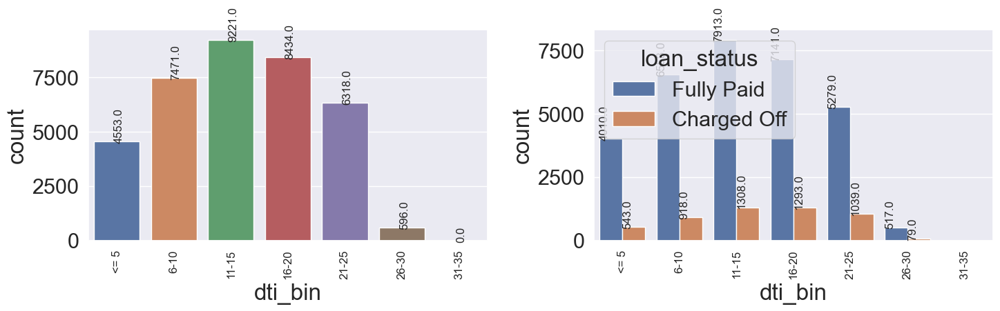

In [155]:
plot_distribution_categorical_with_target(loan_data, col='dti_bin', target="loan_status")

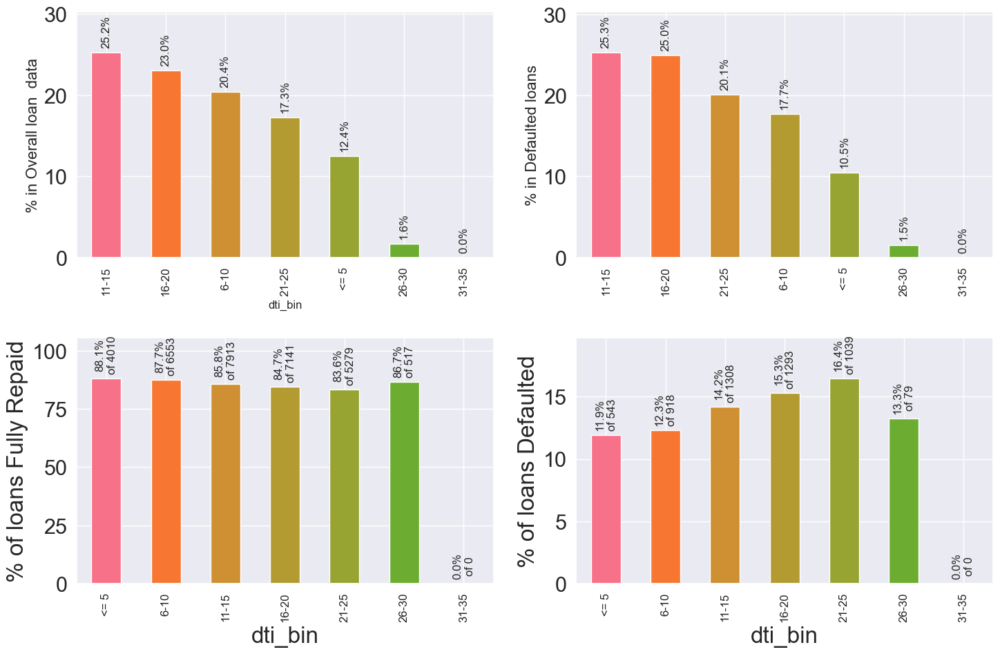

In [156]:
plot_overall_percentages_and_within_percentage(loan_data, 'dti_bin')

#### Observation for <b style="color:Green"> dti</b>
<ul>
<li>
Most of the borrowers having dti between 10-15
</li>
<li>We can see pattern of increased chances of Charged off with increased dti value, whereas not much change in percentage chance increase.
</li>
<li>
</li>
</ul>

#### Variable <b style="color:Green"> pub_rec</b>
Number of derogatory public records

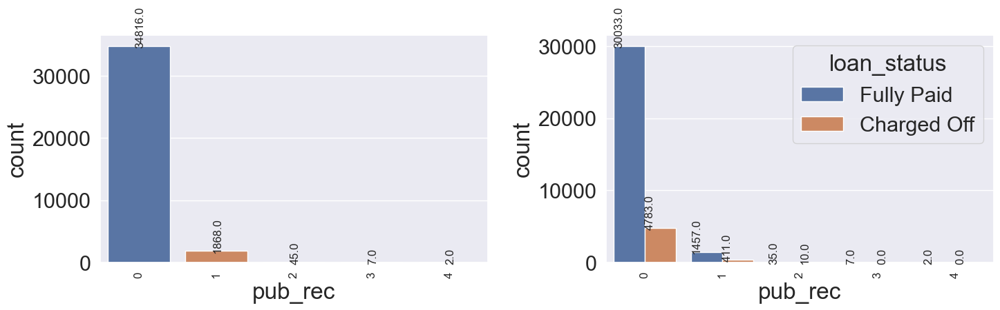

In [157]:
plot_distribution_categorical_with_target(loan_data, col='pub_rec', target="loan_status")

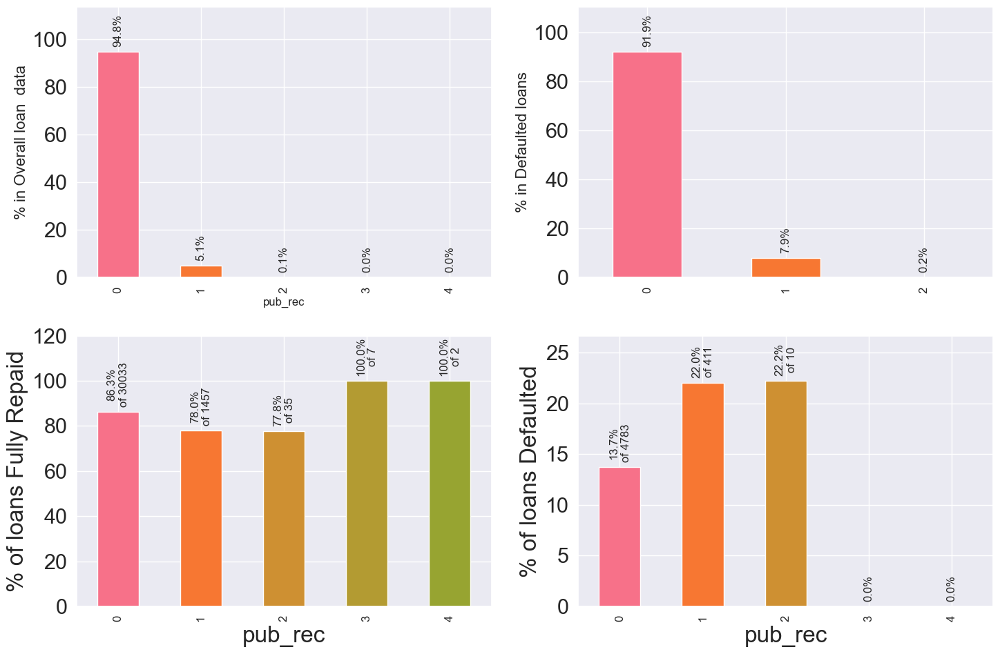

In [158]:
plot_overall_percentages_and_within_percentage(loan_data, 'pub_rec')

#### Observation for <b style="color:Green"> pub_rec</b>
<ul>
<li>
95% borrowers do not have any derogatory public records.
</li>
<li>
There is a significant increase in probability of Charged off records from 0 to 1. LC should consider pub_rec while approving any loan
</li>
<li>
</li>
</ul>


### Bivariate analysis

#### Variable <b style="color:Green"> loan_amnt and annual_inc</b>


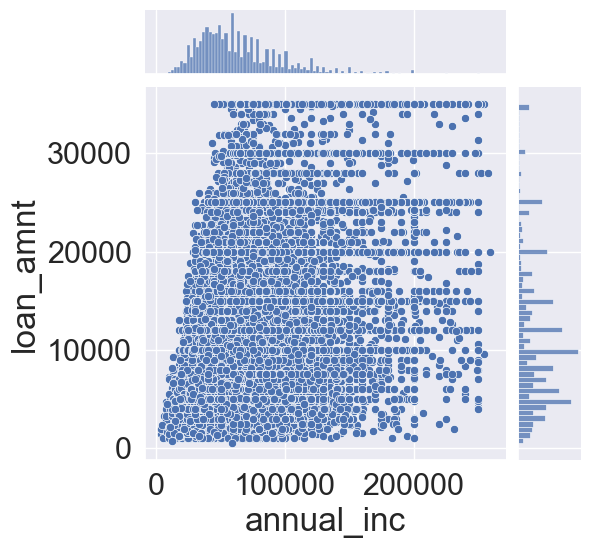

In [159]:
sns.jointplot(x='annual_inc', y='loan_amnt', data=loan_data.loc[loan_data['annual_inc']<260000])#.set_fontsize(12)
plt.rcParams["font.size"]=7
plt.show()

#### Observation for <b style="color:Green"> loan_amnt and annual_inc</b>
<ul>
<li>
People with less annual income, also able to apply for higher amount of loan, LC should consider this, because having low income with high loan may get Charged Off
</li>

</ul>

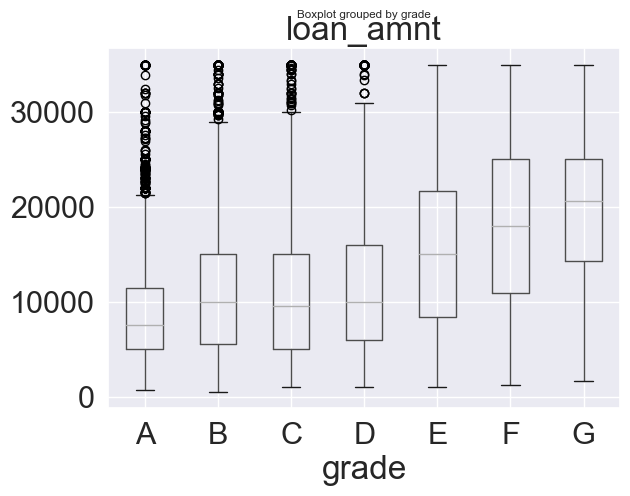

In [160]:
loan_data.boxplot(column='loan_amnt', by='grade')
plt.show()

#### Observation for <b style="color:Green"> loan_amnt and Grade</b>
<ul>
<li>
For lower grade approved loan amount is high, which is bad, because Charged Off loan probability is high in lower grade. Which in turn may result into higher loss.
</li>

</ul>

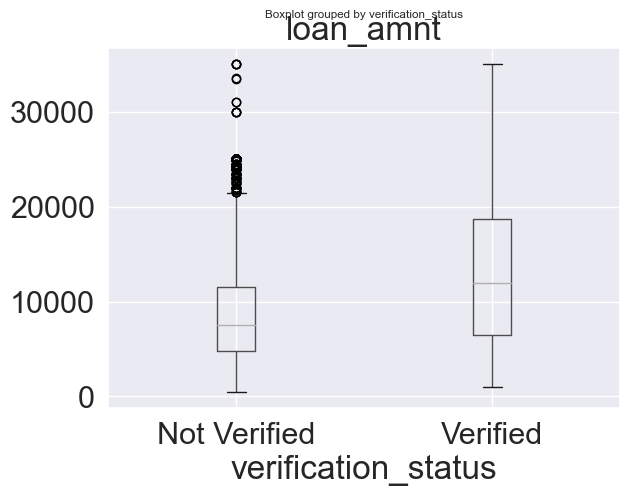

In [161]:
loan_data.boxplot(column='loan_amnt', by='verification_status')
plt.show()

#### Observation for <b style="color:Green"> loan_amnt and verification_status</b>
<ul>
<li>
Unverified loans are having lower loan_amnt, that means higher loan amount is being verified by LC. 
</li>
<li>We see some Not verified loans with very high loan amount, LC should improve verification for high loan amounts.
</li>

</ul>

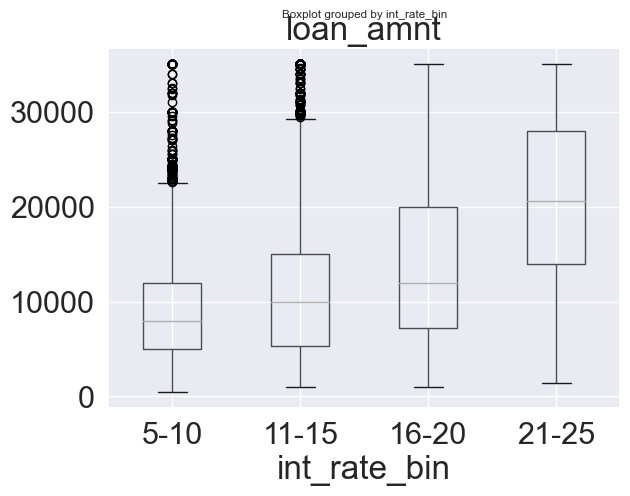

In [162]:
loan_data.boxplot(column='loan_amnt', by='int_rate_bin')
plt.show()

#### Observation for <b style="color:Green"> loan_amnt and int_rate</b>
<ul>
<li>
Higher loan amount is charged higher intererst rate, we see a gradual increase in median for loan amount with increase in interst rate.
</li>

</ul>

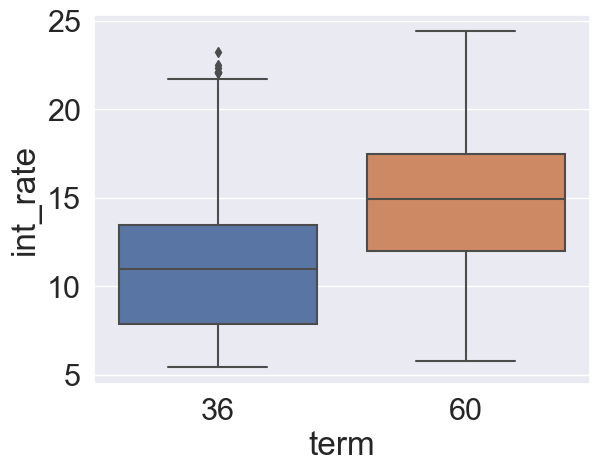

In [163]:
sns.boxplot(
    x='term',
    y='int_rate',
    data=loan_data
)
plt.show()

#### Observation for <b style="color:Green"> int_rate and term</b>
<ul>
<li>
Lower interest rate charged for small term loans. For long term loans interest rates are higher.
</li>

</ul>

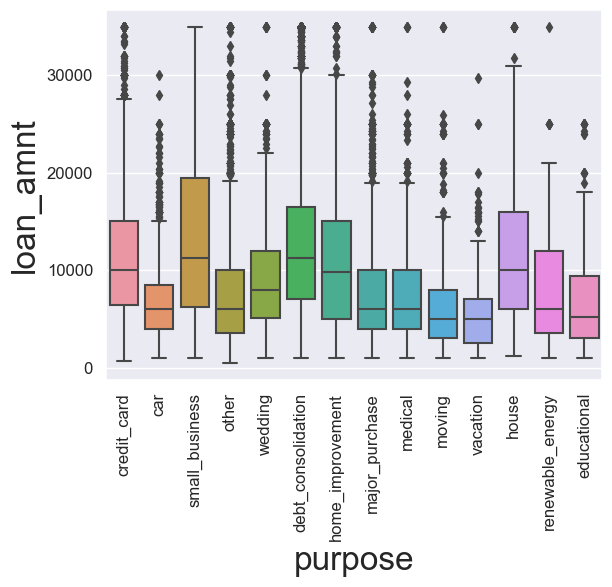

In [164]:
sns.boxplot(
    x='purpose',
    y='loan_amnt',
    data=loan_data
)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.show()

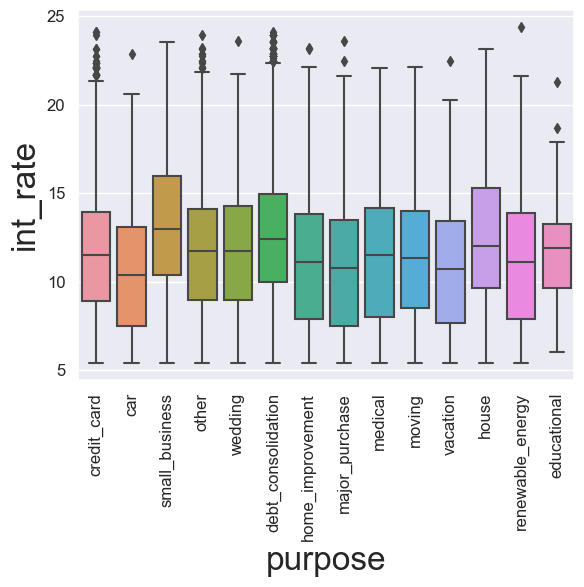

In [165]:
sns.boxplot(
    x='purpose',
    y='int_rate',
    data=loan_data
)
plt.xticks(fontsize=12,rotation=90)
plt.yticks(fontsize=12)
plt.show()

#### Observation for <b style="color:Green"> pupose with loan_amnt and int_rate</b>
<ul>
<li>
Interest Rate and loan amout is higher for Small Business, as compare to other loans. same with house loan, but less than small business.
</li>
<li>
</li>
<li>
</li>
</ul>

<Axes: xlabel='grade', ylabel='int_rate'>

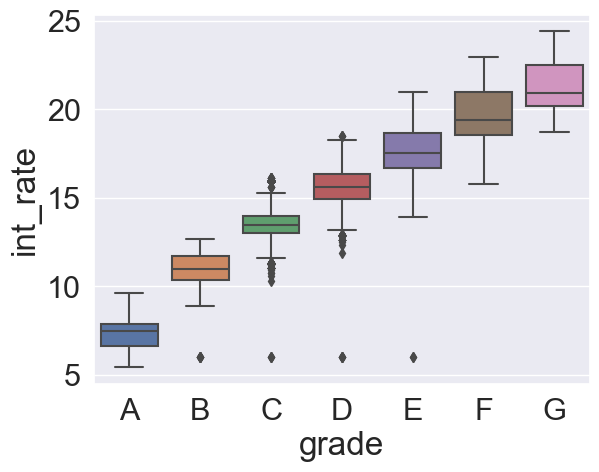

In [166]:
sns.boxplot(
    x='grade',
    y='int_rate',
    data=loan_data,
    order=['A','B','C','D','E','F','G']
)

#### Observation for <b style="color:Green"> grade and int_rate</b>
<ul>
<li>
Higher interest rate assigned for lower grade loans
</li>

</ul>

<Axes: xlabel='loan_status', ylabel='int_rate'>

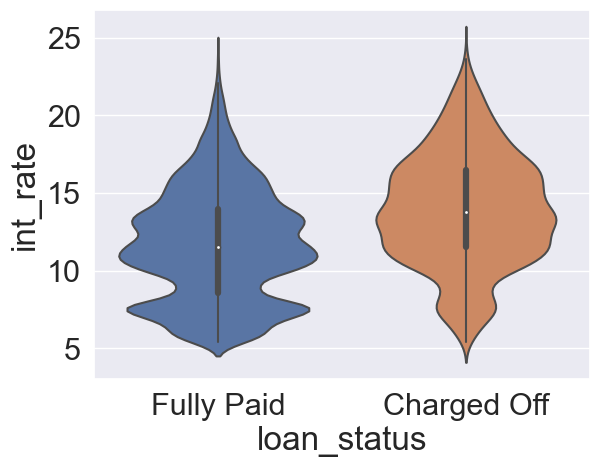

In [167]:
sns.violinplot(
    x='loan_status',
    y='int_rate',
    data=loan_data
)


<Axes: xlabel='loan_status', ylabel='int_rate'>

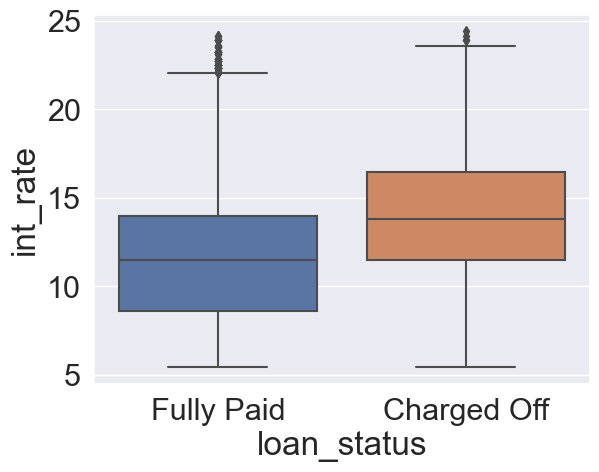

In [168]:
sns.boxplot(
    x='loan_status',
    y='int_rate',
    data=loan_data
)


#### Observation for <b style="color:Green"> Loan_status and inerest Rate</b>
<ul>
<li>
Charged Off loans had higher interest rate.
</li>

</ul>

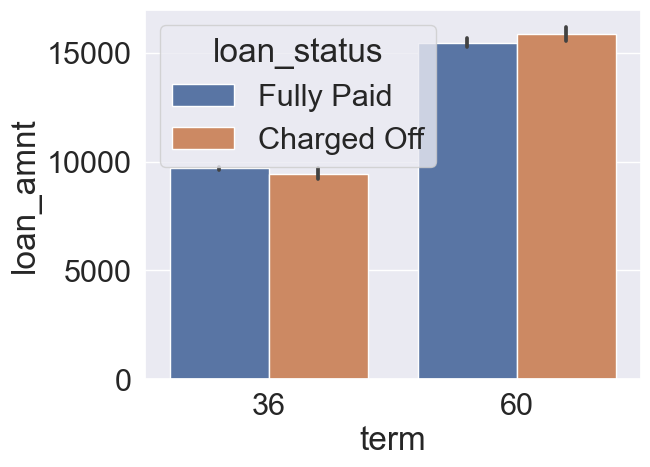

In [169]:
sns.barplot(x='term', y='loan_amnt', hue="loan_status", data=loan_data, estimator=np.mean)
plt.show()

In [170]:
loan_data_recoveries = loan_data[loan_data['loan_status']=='Charged Off']


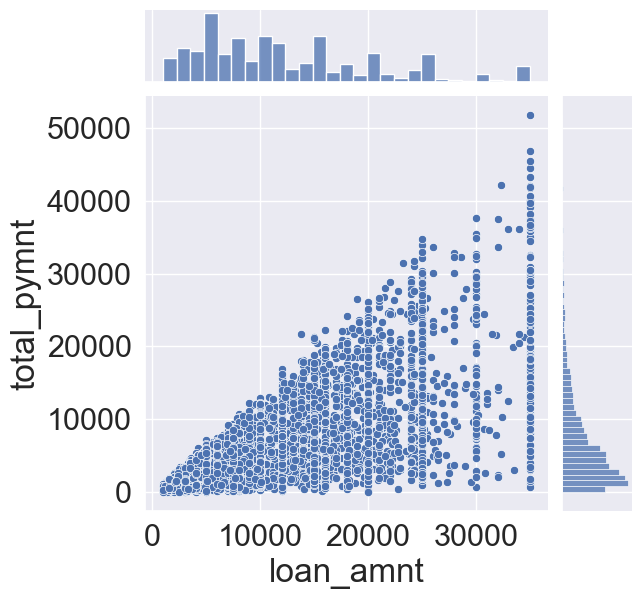

In [171]:
sns.jointplot(x="loan_amnt", y="total_pymnt", data=loan_data_recoveries)
plt.show()

In [172]:
loan_data_recoveries[(loan_data_recoveries['loan_amnt']<= loan_data_recoveries['total_pymnt'])][['loan_amnt','total_pymnt']].head(10) 

,loan_amnt,total_pymnt
46,5000,5021.37
50,15000,16177.77
114,10000,11730.60
212,15075,15502.77
224,7200,7730.87
239,15600,16894.08
255,10000,11604.88
314,25000,25775.38
318,18000,20808.83
362,25000,29415.85


In [173]:
prncpl_rec =loan_data_recoveries[(loan_data_recoveries['loan_amnt']<=loan_data_recoveries['total_pymnt'])].shape[0]

In [174]:
prncpl_not_rec =loan_data_recoveries[(loan_data_recoveries['loan_amnt']>loan_data_recoveries['total_pymnt'])].shape[0]

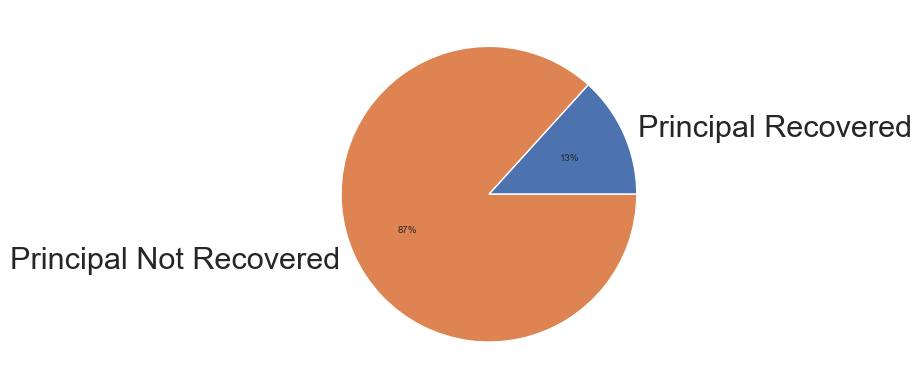

In [175]:
plt.pie([prncpl_rec,prncpl_not_rec], labels=['Principal Recovered', 'Principal Not Recovered'], autopct='%.0f%%')
plt.show()

#### Observation for <b style="color:Green"> loan_amnt and recoveries and total_pymnt</b>
<ul>
<li>
There are multiple Charged Off  loans where more than principal recovered. For 13% Charged Off loans principle revered, but there are 87% loans where even principle was not recovered.
</li>

</ul>

In [176]:
(loan_data_recoveries['recoveries'].sum()/loan_data_recoveries['total_pymnt'].sum())*100

9.82738088431693

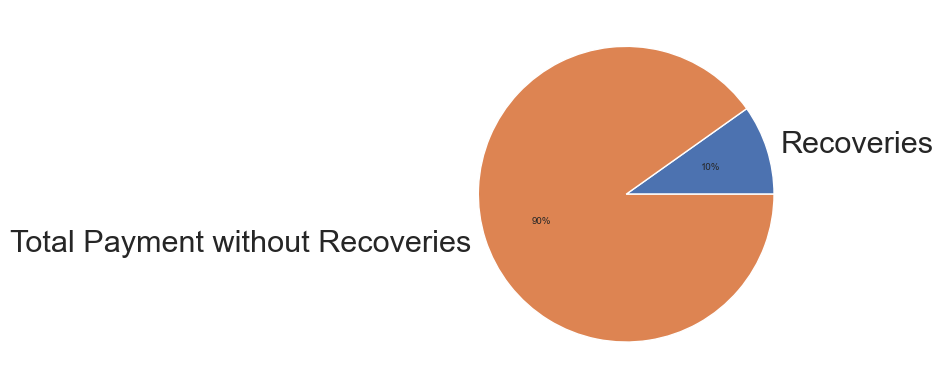

In [177]:
plt.pie([loan_data_recoveries['recoveries'].sum(),(loan_data_recoveries['total_pymnt']-loan_data_recoveries['recoveries']).sum()], labels=['Recoveries', 'Total Payment without Recoveries'], autopct='%.0f%%')
plt.show()

#### Observation for <b style="color:Green"> total payment and recoveries</b>
<ul>
<li>
10% of the total payment is from recoveries for Charged Off loans.
</li>

</ul>

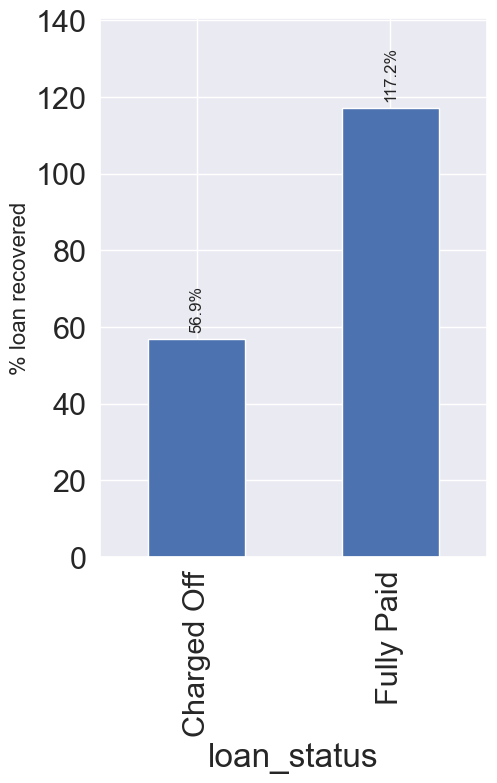

In [179]:
## in this plot we can find how much loan is getting recovered after paid and defaulted
plt.figure(figsize=(5,7))
ax = (loan_data.groupby('loan_status').total_pymnt.sum() * 100 / loan_data.groupby('loan_status').loan_amnt.sum()).plot.bar()
ax.set_ylabel('% loan recovered', fontsize=16)
plt.margins(0.2, 0.2)
showLabels_withpercent(ax)

### Outcome from above graph
#### defaulters are mostly paying 57% of amount, whereas with fully paid loans LC making 17% of profit

In [189]:
fig = plt.figure(figsize=(20,20), dpi = 480)
sns.heatmap(loan_data.drop(columns=['out_prncp','out_prncp_inv'],axis=1).corr(), annot = True, fmt = '.2f')
plt.show()

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\2654735211.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(loan_data.drop(columns=['out_prncp','out_prncp_inv'],axis=1).corr(), annot = True, fmt = '.2f')


## Above we see a very high correlation between Below
<ul>
<li>
loan_amnt, funded_amnt and funded_amnt_inv (above 90%), so we can exclude 2 of them
    </li>
    <li>
c, total_pymntinv and total_rec_prncp (above 90%), so we can exclude 2 of them
    </li>
    <li>
loan_amnt, funded_amnt and funded_amnt_inv are corelated to total_pymnt, total_pymntinv and total_rec_prncp 
    </li>    
     <li>
We observe Higher co-relation between pub_rec and pub_rec_bankrupruptcies
    </li>
    <li>
        between recoveries and collection_recovery_fee there is correlation of around 80%, which is obvious
    </li>
    <li>
        installment is also related to total_pymnt, total_pymntinv and total_rec_prncp also with loan_amnt, funded_amnt and funded_amnt_inv
    </li>
    </ul>


linear correlation between columns is clearly visible in below scatter plot

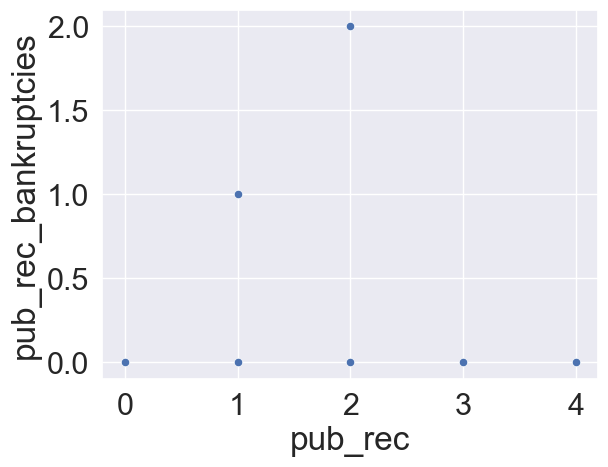

In [181]:
sns.scatterplot(x='pub_rec',y='pub_rec_bankruptcies', data=loan_data)
plt.show()

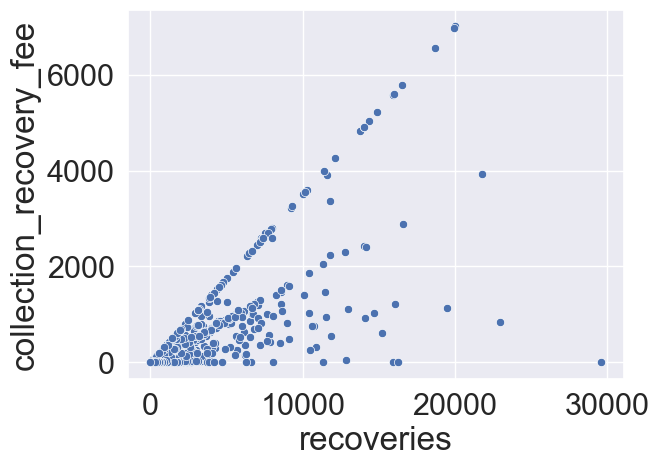

In [182]:
sns.scatterplot(x='recoveries',y='collection_recovery_fee', data=loan_data)
plt.show()

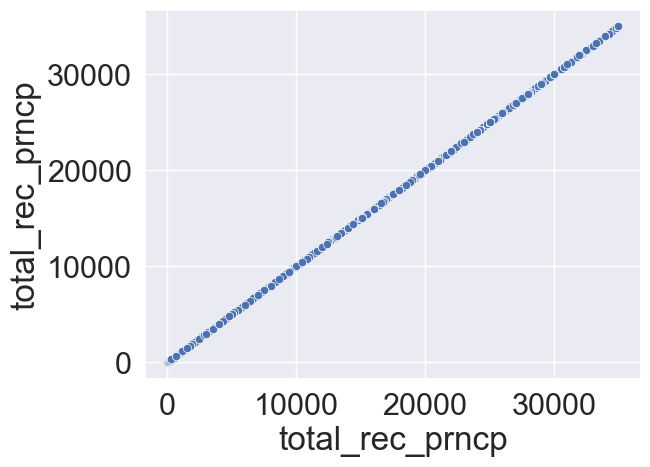

In [183]:
sns.scatterplot(x='total_rec_prncp',y='total_rec_prncp', data=loan_data)
plt.show()

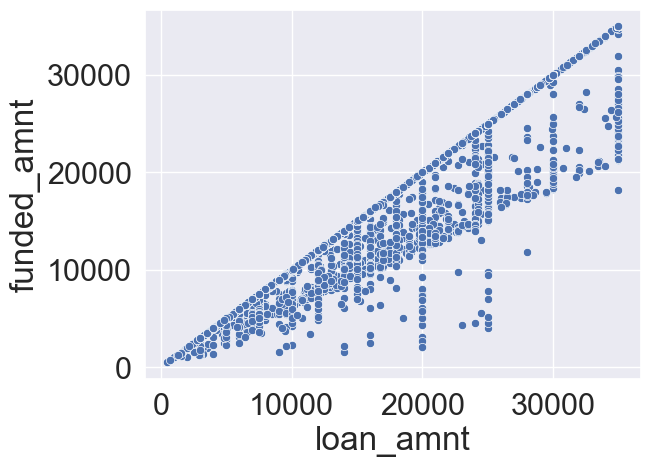

In [184]:
sns.scatterplot(x='loan_amnt',y='funded_amnt', data=loan_data)
plt.show()

In [185]:
loan_data['loan_status_map'] =loan_data['loan_status'].map({'Fully Paid':0,'Charged Off':1})

In [186]:
corr_matrix = loan_data.corr()
print(corr_matrix["loan_status_map"].sort_values(ascending=False))

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\2312852103.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = loan_data.corr()


loan_status_map            1.000000
recoveries                 0.342245
int_rate                   0.213451
collection_recovery_fee    0.204670
term                       0.179793
total_rec_late_fee         0.168392
revol_util                 0.100473
inq_last_6mths             0.068132
loan_amnt                  0.062947
funded_amnt                0.059595
pub_rec                    0.049592
funded_amnt_inv            0.046010
pub_rec_bankruptcies       0.045071
dti                        0.043732
issue_d_year               0.030811
installment                0.028271
issue_d_month              0.026781
earliest_cr_line_year      0.021542
total_rec_int              0.018935
emp_length                 0.016964
delinq_2yrs                0.016868
revol_bal                  0.008641
open_acc                  -0.003979
total_acc                 -0.018229
earliest_cr_line_month    -0.020223
annual_inc                -0.038391
last_pymnt_amnt           -0.220926
total_pymnt_inv           -0

In [187]:
loan_data.drop(columns=['loan_status_map']).corrwith(loan_data['loan_status_map'])

C:\Users\pujak\AppData\Local\Temp\ipykernel_17960\2771264940.py:1: FutureWarning: The default value of numeric_only in DataFrame.corrwith is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  loan_data.drop(columns=['loan_status_map']).corrwith(loan_data['loan_status_map'])


loan_amnt                  0.062947
funded_amnt                0.059595
funded_amnt_inv            0.046010
term                       0.179793
int_rate                   0.213451
installment                0.028271
emp_length                 0.016964
annual_inc                -0.038391
dti                        0.043732
delinq_2yrs                0.016868
inq_last_6mths             0.068132
open_acc                  -0.003979
pub_rec                    0.049592
revol_bal                  0.008641
revol_util                 0.100473
total_acc                 -0.018229
out_prncp                       NaN
out_prncp_inv                   NaN
total_pymnt               -0.230654
total_pymnt_inv           -0.229177
total_rec_prncp           -0.330928
total_rec_int              0.018935
total_rec_late_fee         0.168392
recoveries                 0.342245
collection_recovery_fee    0.204670
last_pymnt_amnt           -0.220926
pub_rec_bankruptcies       0.045071
issue_d_month              0